In [ ]:
# Libraries Import
import os
import cv2

**Dataset**

In [2]:
import tensorflow as tf
import os

In [3]:
# Assuming you have two folders: real_images_folder and segmented_images_folder
# real_images_folder = "/content/drive/MyDrive/Artist_AI/Datasets/ProductImage"
# segmented_images_folder = '/content/drive/MyDrive/Artist_AI/Datasets/CannyProductImage'

real_images_folder = "/content/drive/MyDrive/Artist_AI/Datasets/SceneryImages"
segmented_images_folder = '/content/drive/MyDrive/Artist_AI/Datasets/CannySceneryImages'

real_image_paths = sorted([os.path.join(real_images_folder, filename) for filename in os.listdir(real_images_folder)])
segmented_image_paths = sorted([os.path.join(segmented_images_folder, filename) for filename in os.listdir(segmented_images_folder)])

# Pair up the paths
paired_paths = list(zip(real_image_paths, segmented_image_paths))

# Custom data loader
def load_image(image_path):
    image = tf.io.read_file(image_path)
    image = tf.image.decode_image(image, channels=3)
    image = tf.cast(image, tf.float32)  # Ensure that the image is in float32 format
    image = (image / 127.5) - 1
    return image

def load_data(real_image_path, segmented_image_path):
    real_image = load_image(real_image_path)
    segmented_image = load_image(segmented_image_path)
    return real_image, segmented_image

def create_dataset(paired_paths):
    dataset = tf.data.Dataset.from_tensor_slices(paired_paths)
    dataset = dataset.map(lambda x: load_data(x[0], x[1]), num_parallel_calls=tf.data.experimental.AUTOTUNE)
    dataset = dataset.batch(8)
    dataset = dataset.prefetch(buffer_size=tf.data.experimental.AUTOTUNE)
    return dataset

In [4]:
paired_paths[0]

('/content/drive/MyDrive/Artist_AI/Datasets/SceneryImages/00000000.jpg',
 '/content/drive/MyDrive/Artist_AI/Datasets/CannySceneryImages/00000000.jpg')

In [5]:
import tensorflow as tf
from tensorflow.keras import layers, Model, models
from tensorflow.keras.losses import BinaryCrossentropy
from tensorflow.keras.optimizers import Adam

In [6]:
def unet_generator(input_shape=(256, 256, 3), num_filters=32):
    inputs = layers.Input(shape=input_shape)

    # Encoder
    conv1 = conv_block(inputs, num_filters)
    pool1 = layers.MaxPooling2D(pool_size=(2, 2))(conv1)

    conv2 = conv_block(pool1, num_filters * 2)
    pool2 = layers.MaxPooling2D(pool_size=(2, 2))(conv2)

    conv3 = conv_block(pool2, num_filters * 4)
    pool3 = layers.MaxPooling2D(pool_size=(2, 2))(conv3)

    # Bottleneck
    conv4 = conv_block(pool3, num_filters * 8)

    # Decoder
    up5 = layers.UpSampling2D(size=(2, 2))(conv4)
    up5 = layers.Conv2D(num_filters * 4, (3, 3), activation='relu', padding='same')(up5)
    up5 = layers.concatenate([up5, conv3], axis=-1)
    conv5 = conv_block(up5, num_filters * 4)

    up6 = layers.UpSampling2D(size=(2, 2))(conv5)
    up6 = layers.Conv2D(num_filters * 2, (3, 3), activation='relu', padding='same')(up6)
    up6 = layers.concatenate([up6, conv2], axis=-1)
    conv6 = conv_block(up6, num_filters * 2)

    up7 = layers.UpSampling2D(size=(2, 2))(conv6)
    up7 = layers.Conv2D(num_filters, (3, 3), activation='relu', padding='same')(up7)
    up7 = layers.concatenate([up7, conv1], axis=-1)
    conv7 = conv_block(up7, num_filters)

    # Output layer
    outputs = layers.Conv2D(3, (1, 1), activation='tanh')(conv7)

    model = models.Model(inputs=inputs, outputs=outputs, name='unet_generator')
    return model

def conv_block(x, filters):
    x = layers.Conv2D(filters, (3, 3), activation='relu', padding='same')(x)
    x = layers.BatchNormalization()(x)
    x = layers.Conv2D(filters, (3, 3), activation='relu', padding='same')(x)
    x = layers.BatchNormalization()(x)
    return x

In [7]:
# Updated Discriminator function
def build_discriminator():
    input_shape = (256, 256, 3)

    input_img = layers.Input(shape=input_shape)
    target_img = layers.Input(shape=input_shape)

    x = layers.concatenate([input_img, target_img])  # Concatenate the input images

    x = layers.Conv2D(64, (4, 4), strides=(2, 2), padding='same')(x)
    x = layers.LeakyReLU(0.2)(x)

    x = layers.Conv2D(128, (4, 4), strides=(2, 2), padding='same')(x)
    x = layers.BatchNormalization()(x)
    x = layers.LeakyReLU(0.2)(x)

    x = layers.Conv2D(256, (4, 4), strides=(2, 2), padding='same')(x)
    x = layers.BatchNormalization()(x)
    x = layers.LeakyReLU(0.2)(x)

    # Output layer
    validity = layers.Conv2D(1, (4, 4), strides=(1, 1), padding='same')(x)

    return Model(inputs=[input_img, target_img], outputs=validity)

In [8]:
# Generator loss
def generator_loss(fake_output, target_output):
    target_output = tf.image.resize(target_output, (fake_output.shape[1], fake_output.shape[2]))
    return tf.keras.losses.MeanSquaredError()(target_output, fake_output)


# Discriminator loss
def discriminator_loss(real_output, fake_output):
    real_loss = BinaryCrossentropy(from_logits=True)(tf.ones_like(real_output), real_output)
    fake_loss = BinaryCrossentropy(from_logits=True)(tf.zeros_like(fake_output), fake_output)
    total_loss = real_loss + fake_loss
    return total_loss

# Optimizers
generator_optimizer = tf.keras.optimizers.Adam(learning_rate=2e-4, beta_1=0.5)
discriminator_optimizer = Adam(learning_rate=2e-4, beta_1=0.5)

# Conditional GAN model
generator = unet_generator()
discriminator = build_discriminator()

# Compile the models
generator.compile(optimizer=generator_optimizer, loss=generator_loss)
discriminator.compile(optimizer=discriminator_optimizer, loss=discriminator_loss)

In [9]:
import matplotlib.pyplot as plt
# Function to visualize progress
def visualize_progress(generator, segmented_images, real_images, epoch):
    generated_images = generator(segmented_images, training=False)

    real_images = (real_images + 1) * 0.5
    segmented_images = (segmented_images + 1) * 0.5
    generated_images = (generated_images + 1) * 0.5

    plt.figure(figsize=(15, 5))

    for i in range(min(4, real_images.shape[0])):
        plt.subplot(3, 4, i + 1)
        plt.imshow(segmented_images[i])
        plt.title('Segmented Image')
        plt.axis('off')

        plt.subplot(3, 4, i + 5)
        plt.imshow(real_images[i])
        plt.title('Real Image')
        plt.axis('off')

        plt.subplot(3, 4, i + 9)
        plt.imshow(generated_images[i])
        plt.title('Generated Image')
        plt.axis('off')

    plt.tight_layout()
    plt.show()

In [10]:
def save_model(generator, discriminator, generator_path, discriminator_path):
    # Save the generator model to the specified file path
    generator.save(generator_path)

    # Save the discriminator model to the specified file path
    discriminator.save(discriminator_path)

In [13]:
# Training function with U-Net architecture
def train_pix2pix(generator, discriminator, epochs, train_dataset, generator_optimizer, discriminator_optimizer, generator_loss, discriminator_loss, save_interval=5, save_path='/content/drive/MyDrive/Artist_AI/scnerey_saved_models'):
    # Create a directory for saving models if it doesn't exist
    os.makedirs(save_path, exist_ok=True)

    for epoch in range(epochs):
        for real_images, segmented_images in train_dataset:
            with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
                generated_images = generator(segmented_images, training=True)
                real_output = discriminator([segmented_images, real_images], training=True)
                fake_output = discriminator([segmented_images, generated_images], training=True)
                gen_loss = generator_loss(fake_output, generated_images)
                disc_loss = discriminator_loss(real_output, fake_output)

            gradients_of_generator = gen_tape.gradient(gen_loss, generator.trainable_variables)
            gradients_of_discriminator = disc_tape.gradient(disc_loss, discriminator.trainable_variables)

            generator_optimizer.apply_gradients(zip(gradients_of_generator, generator.trainable_variables))
            discriminator_optimizer.apply_gradients(zip(gradients_of_discriminator, discriminator.trainable_variables))

            # Calculate and print pixel distance
            pixel_distance = tf.reduce_mean(tf.abs(real_images - generated_images)).numpy()

        print(f"Epoch {epoch+1}/{epochs}, Generator Loss: {gen_loss.numpy()}, Discriminator Loss: {disc_loss.numpy()}, Pixel Distance: {pixel_distance}")

        # Save models every 50 epochs
        if (epoch + 1) % 50 == 0:
            save_model(generator, discriminator, generator_path=f'{save_path}/generator_epoch_{epoch + 1}.h5',
                       discriminator_path=f'{save_path}/discriminator_epoch_{epoch + 1}.h5')

        # Print progress every few epochs
        if (epoch + 1) % save_interval == 0:
            # Save and visualize generated images
            # Assuming visualize_progress function exists and is appropriate for your use case
            visualize_progress(generator, segmented_images, real_images, epoch)

    # Save models in SavedModel format at the end of training
    save_model(generator, discriminator, generator_path=f'/content/drive/MyDrive/Artist_AI/scenery_h5/generator.h5',
               discriminator_path='/content/drive/MyDrive/Artist_AI/scenery_h5/discriminator.h5')

Product

Epoch 1/200, Generator Loss: 11.925373077392578, Discriminator Loss: 0.9992493987083435, Pixel Distance: 0.27259746193885803
Epoch 2/200, Generator Loss: 2.4455480575561523, Discriminator Loss: 0.9334378242492676, Pixel Distance: 0.22207313776016235
Epoch 3/200, Generator Loss: 2.229902982711792, Discriminator Loss: 1.008373498916626, Pixel Distance: 0.20085054636001587
Epoch 4/200, Generator Loss: 4.160763263702393, Discriminator Loss: 0.7521575689315796, Pixel Distance: 0.20027954876422882
Epoch 5/200, Generator Loss: 1.8126106262207031, Discriminator Loss: 1.0199891328811646, Pixel Distance: 0.19292981922626495


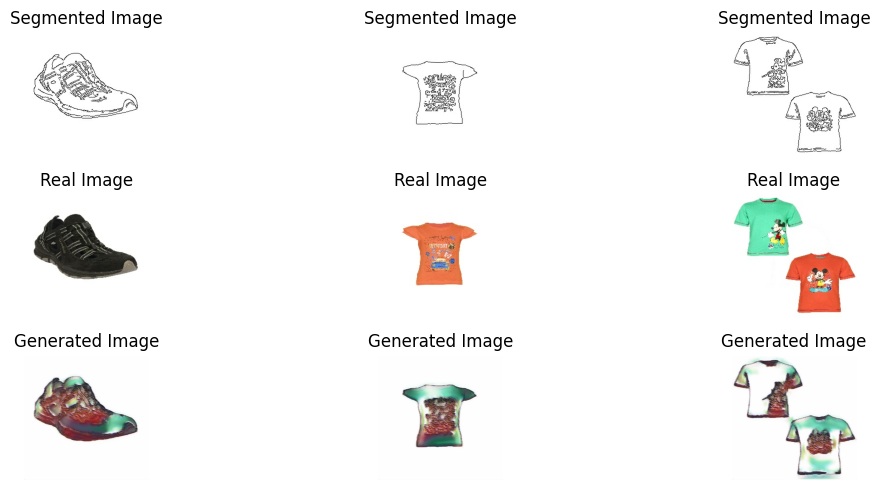

Epoch 6/200, Generator Loss: 5.106470584869385, Discriminator Loss: 0.6293736696243286, Pixel Distance: 0.2166842371225357
Epoch 7/200, Generator Loss: 2.6644175052642822, Discriminator Loss: 0.9548388719558716, Pixel Distance: 0.17486105859279633
Epoch 8/200, Generator Loss: 2.909501075744629, Discriminator Loss: 0.8424807786941528, Pixel Distance: 0.1821741759777069
Epoch 9/200, Generator Loss: 7.029552459716797, Discriminator Loss: 0.5850335359573364, Pixel Distance: 0.22710204124450684
Epoch 10/200, Generator Loss: 8.232775688171387, Discriminator Loss: 0.5599728226661682, Pixel Distance: 0.1967201679944992


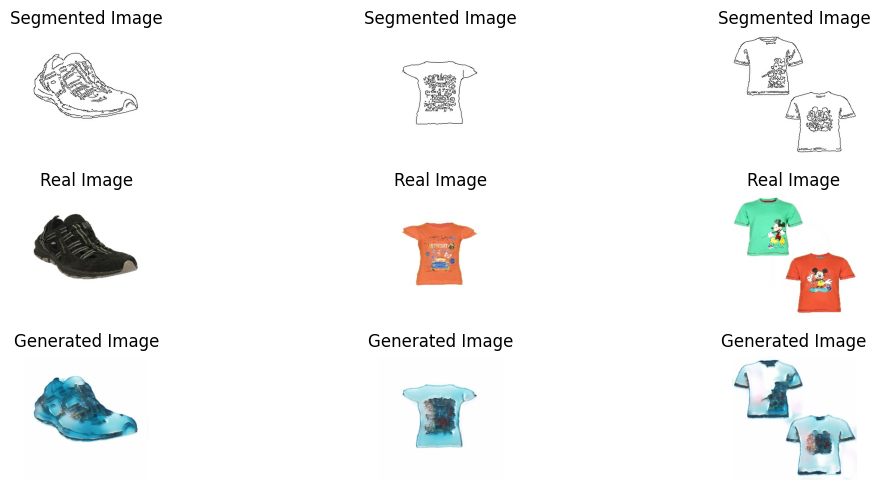

Epoch 11/200, Generator Loss: 6.70256233215332, Discriminator Loss: 0.4392189383506775, Pixel Distance: 0.22378621995449066
Epoch 12/200, Generator Loss: 5.8096923828125, Discriminator Loss: 0.7062013149261475, Pixel Distance: 0.18375526368618011
Epoch 13/200, Generator Loss: 6.784547805786133, Discriminator Loss: 0.8267231583595276, Pixel Distance: 0.24160705506801605
Epoch 14/200, Generator Loss: 9.228825569152832, Discriminator Loss: 0.3380662202835083, Pixel Distance: 0.21738964319229126
Epoch 15/200, Generator Loss: 4.0829081535339355, Discriminator Loss: 0.7403273582458496, Pixel Distance: 0.19933022558689117


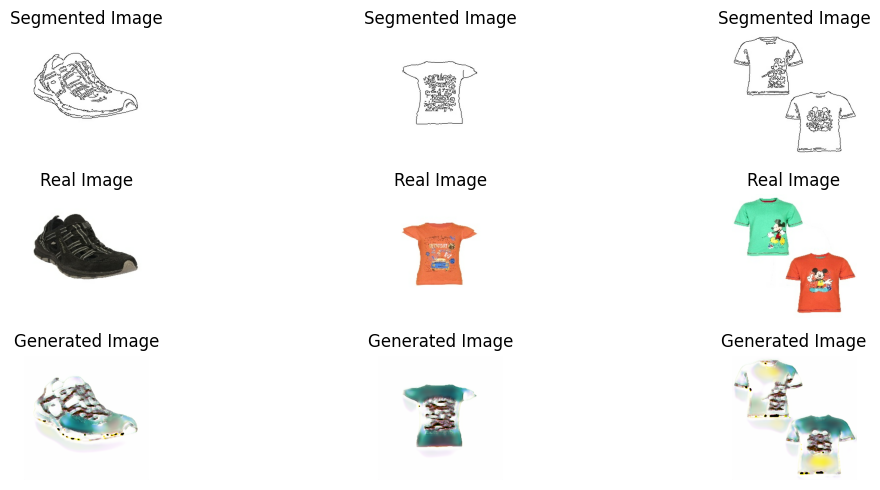

Epoch 16/200, Generator Loss: 15.177084922790527, Discriminator Loss: 0.3481612801551819, Pixel Distance: 0.2365451604127884
Epoch 17/200, Generator Loss: 7.4497246742248535, Discriminator Loss: 0.4890943765640259, Pixel Distance: 0.20449453592300415
Epoch 18/200, Generator Loss: 4.948468208312988, Discriminator Loss: 0.972272515296936, Pixel Distance: 0.17887835204601288
Epoch 19/200, Generator Loss: 4.5407395362854, Discriminator Loss: 0.727542519569397, Pixel Distance: 0.18063455820083618
Epoch 20/200, Generator Loss: 3.329580545425415, Discriminator Loss: 0.49916329979896545, Pixel Distance: 0.19829492270946503


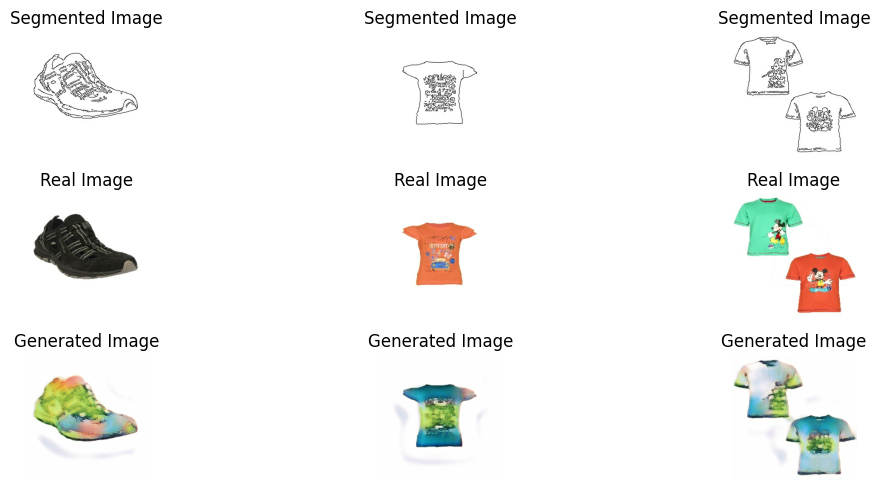

Epoch 21/200, Generator Loss: 5.393886566162109, Discriminator Loss: 0.4969955086708069, Pixel Distance: 0.24054257571697235
Epoch 22/200, Generator Loss: 5.708547115325928, Discriminator Loss: 0.3844972550868988, Pixel Distance: 0.2523352801799774
Epoch 23/200, Generator Loss: 9.190314292907715, Discriminator Loss: 1.2940807342529297, Pixel Distance: 0.1750141978263855
Epoch 24/200, Generator Loss: 3.4587039947509766, Discriminator Loss: 0.5446190237998962, Pixel Distance: 0.1917598843574524
Epoch 25/200, Generator Loss: 3.8993234634399414, Discriminator Loss: 0.699398934841156, Pixel Distance: 0.2058297097682953


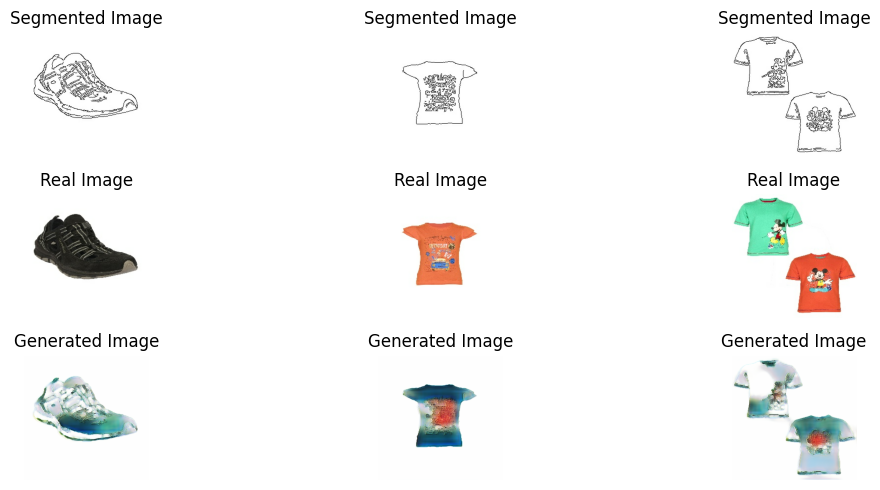

Epoch 26/200, Generator Loss: 3.7975947856903076, Discriminator Loss: 0.40466469526290894, Pixel Distance: 0.18602466583251953
Epoch 27/200, Generator Loss: 6.576688289642334, Discriminator Loss: 0.3955148458480835, Pixel Distance: 0.21838682889938354
Epoch 28/200, Generator Loss: 5.165088176727295, Discriminator Loss: 0.44535964727401733, Pixel Distance: 0.19651655852794647
Epoch 29/200, Generator Loss: 2.2501463890075684, Discriminator Loss: 0.9107900857925415, Pixel Distance: 0.1772698312997818
Epoch 30/200, Generator Loss: 4.021083831787109, Discriminator Loss: 0.6531471014022827, Pixel Distance: 0.16578632593154907


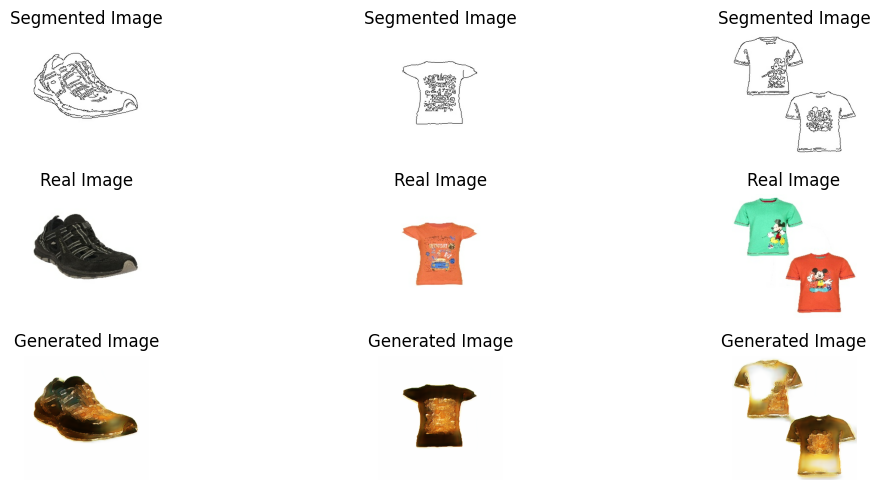

Epoch 31/200, Generator Loss: 4.90077543258667, Discriminator Loss: 0.8128161430358887, Pixel Distance: 0.19719354808330536
Epoch 32/200, Generator Loss: 8.381400108337402, Discriminator Loss: 0.4813826084136963, Pixel Distance: 0.23657025396823883
Epoch 33/200, Generator Loss: 9.693415641784668, Discriminator Loss: 0.538676381111145, Pixel Distance: 0.24352413415908813
Epoch 34/200, Generator Loss: 4.457787036895752, Discriminator Loss: 0.33708950877189636, Pixel Distance: 0.1981213539838791
Epoch 35/200, Generator Loss: 7.8294548988342285, Discriminator Loss: 0.49273526668548584, Pixel Distance: 0.19384732842445374


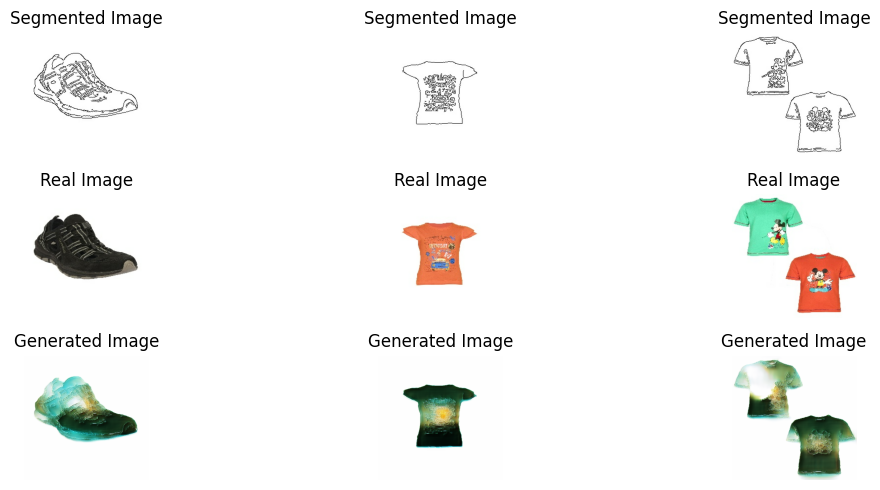

Epoch 36/200, Generator Loss: 3.5853192806243896, Discriminator Loss: 0.5072579383850098, Pixel Distance: 0.21882525086402893
Epoch 37/200, Generator Loss: 11.621220588684082, Discriminator Loss: 0.13978171348571777, Pixel Distance: 0.2409045398235321
Epoch 38/200, Generator Loss: 2.986046075820923, Discriminator Loss: 0.44058874249458313, Pixel Distance: 0.1756119281053543
Epoch 39/200, Generator Loss: 7.762657165527344, Discriminator Loss: 0.30212023854255676, Pixel Distance: 0.21004915237426758
Epoch 40/200, Generator Loss: 4.128861904144287, Discriminator Loss: 0.5613863468170166, Pixel Distance: 0.2063046246767044


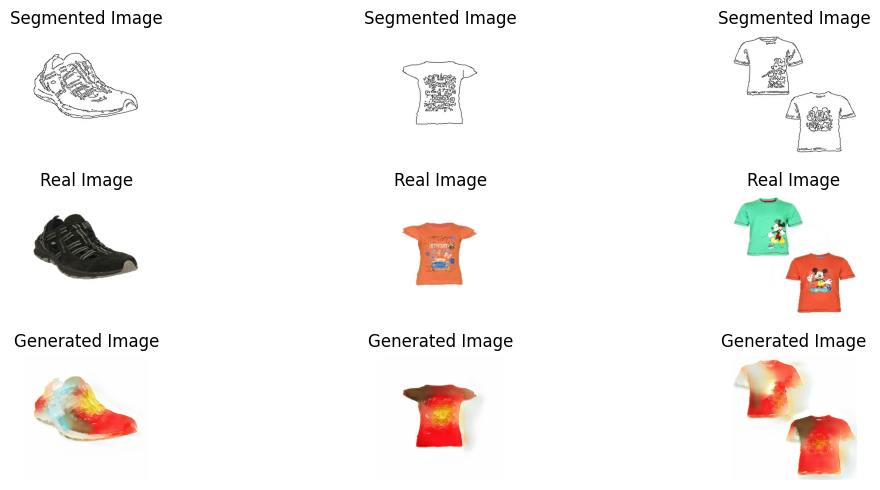

Epoch 41/200, Generator Loss: 8.69784164428711, Discriminator Loss: 0.5379409193992615, Pixel Distance: 0.17679253220558167
Epoch 42/200, Generator Loss: 11.211932182312012, Discriminator Loss: 0.3768133819103241, Pixel Distance: 0.17873993515968323
Epoch 43/200, Generator Loss: 12.45861530303955, Discriminator Loss: 0.26743561029434204, Pixel Distance: 0.22302895784378052
Epoch 44/200, Generator Loss: 5.850917816162109, Discriminator Loss: 0.36771366000175476, Pixel Distance: 0.16695071756839752
Epoch 45/200, Generator Loss: 6.348582744598389, Discriminator Loss: 0.3096463084220886, Pixel Distance: 0.1704036146402359


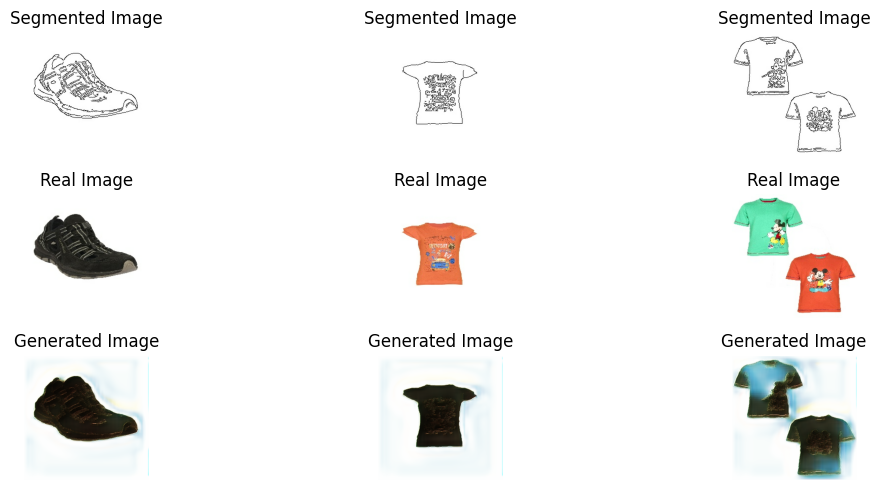

Epoch 46/200, Generator Loss: 7.277629852294922, Discriminator Loss: 0.2521139681339264, Pixel Distance: 0.16770897805690765
Epoch 47/200, Generator Loss: 10.189580917358398, Discriminator Loss: 0.17972984910011292, Pixel Distance: 0.1817919909954071
Epoch 48/200, Generator Loss: 4.68473482131958, Discriminator Loss: 0.39637941122055054, Pixel Distance: 0.2206144630908966
Epoch 49/200, Generator Loss: 6.7146148681640625, Discriminator Loss: 0.25896573066711426, Pixel Distance: 0.17110072076320648
Epoch 50/200, Generator Loss: 12.057974815368652, Discriminator Loss: 0.35257914662361145, Pixel Distance: 0.20785635709762573


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


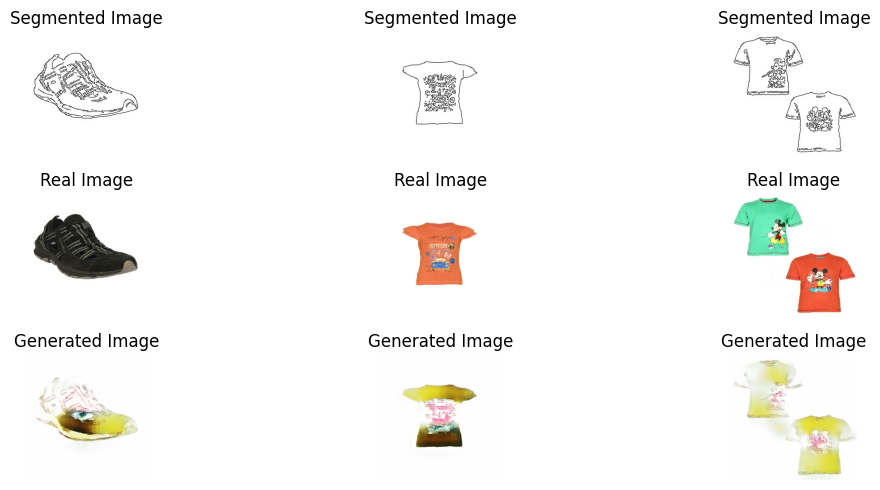

Epoch 51/200, Generator Loss: 6.215183258056641, Discriminator Loss: 0.34013211727142334, Pixel Distance: 0.2025606334209442
Epoch 52/200, Generator Loss: 5.9136786460876465, Discriminator Loss: 0.274512380361557, Pixel Distance: 0.1694023609161377
Epoch 53/200, Generator Loss: 13.480660438537598, Discriminator Loss: 0.29283761978149414, Pixel Distance: 0.22047151625156403
Epoch 54/200, Generator Loss: 10.55772590637207, Discriminator Loss: 0.19999577105045319, Pixel Distance: 0.20965668559074402
Epoch 55/200, Generator Loss: 6.189819812774658, Discriminator Loss: 0.35939157009124756, Pixel Distance: 0.21645429730415344


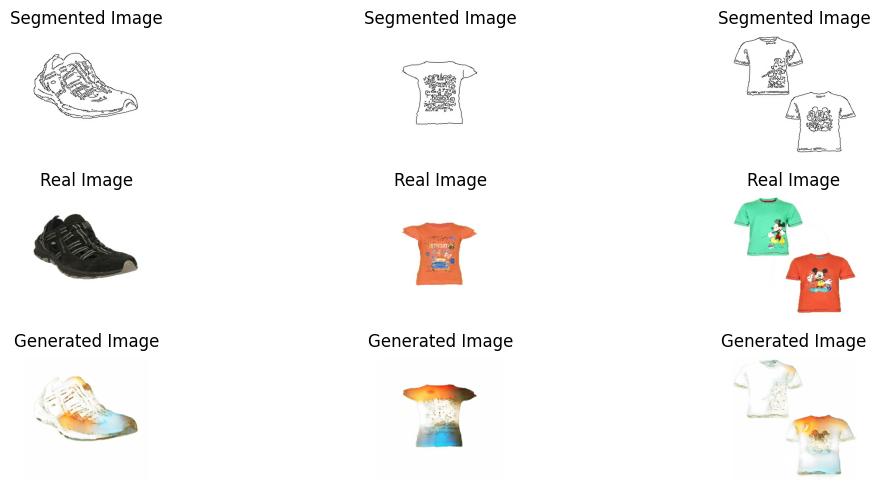

Epoch 56/200, Generator Loss: 3.7219626903533936, Discriminator Loss: 0.4701788127422333, Pixel Distance: 0.20030902326107025
Epoch 57/200, Generator Loss: 7.393906116485596, Discriminator Loss: 0.35342955589294434, Pixel Distance: 0.20783942937850952
Epoch 58/200, Generator Loss: 10.573723793029785, Discriminator Loss: 0.2365659773349762, Pixel Distance: 0.17469990253448486
Epoch 59/200, Generator Loss: 17.841814041137695, Discriminator Loss: 0.09749138355255127, Pixel Distance: 0.2500796914100647
Epoch 60/200, Generator Loss: 6.254358768463135, Discriminator Loss: 0.284860223531723, Pixel Distance: 0.185774028301239


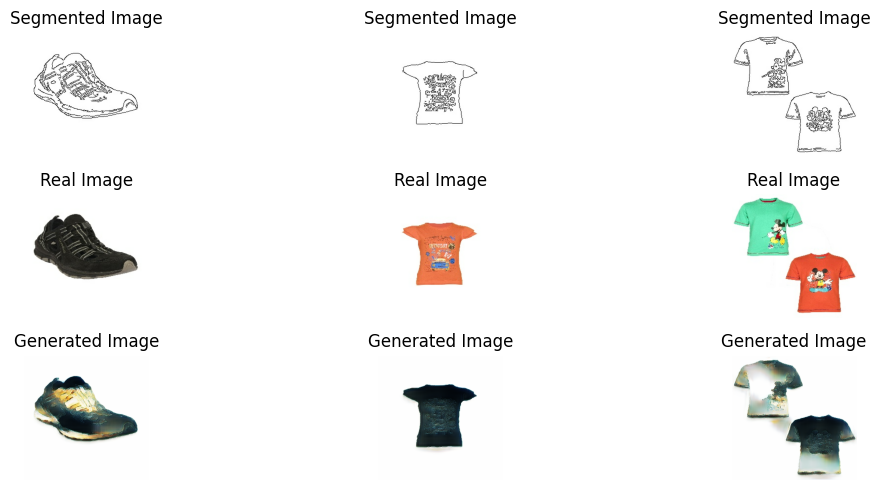

Epoch 61/200, Generator Loss: 16.398969650268555, Discriminator Loss: 0.3046601414680481, Pixel Distance: 0.1887444704771042
Epoch 62/200, Generator Loss: 6.24127197265625, Discriminator Loss: 0.25024592876434326, Pixel Distance: 0.1513652503490448
Epoch 63/200, Generator Loss: 4.085705280303955, Discriminator Loss: 0.3996480107307434, Pixel Distance: 0.1826675534248352
Epoch 64/200, Generator Loss: 2.1843602657318115, Discriminator Loss: 0.5942807793617249, Pixel Distance: 0.1541558802127838
Epoch 65/200, Generator Loss: 5.006677627563477, Discriminator Loss: 0.4081484079360962, Pixel Distance: 0.18051683902740479


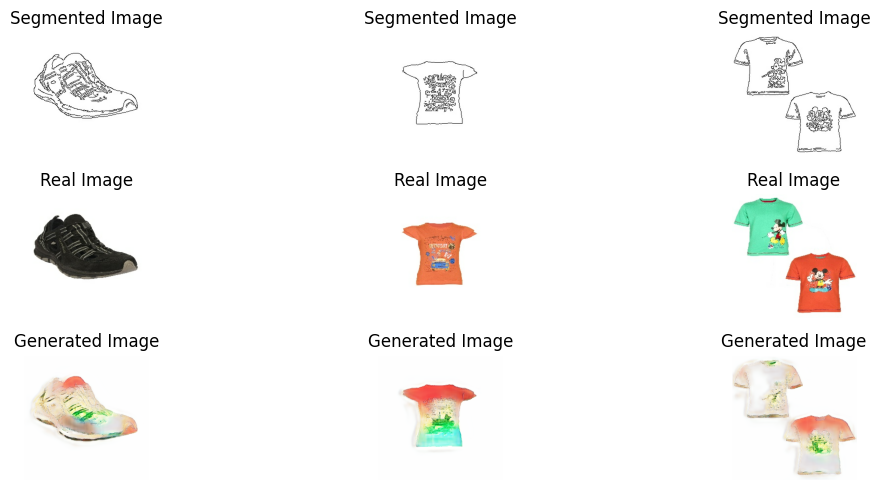

Epoch 66/200, Generator Loss: 3.537583589553833, Discriminator Loss: 0.48385879397392273, Pixel Distance: 0.17833192646503448
Epoch 67/200, Generator Loss: 16.476274490356445, Discriminator Loss: 0.10950005799531937, Pixel Distance: 0.19218887388706207
Epoch 68/200, Generator Loss: 10.969544410705566, Discriminator Loss: 0.16860349476337433, Pixel Distance: 0.19925075769424438
Epoch 69/200, Generator Loss: 12.921905517578125, Discriminator Loss: 0.11891358345746994, Pixel Distance: 0.21597211062908173
Epoch 70/200, Generator Loss: 9.179646492004395, Discriminator Loss: 0.17138633131980896, Pixel Distance: 0.1753198504447937


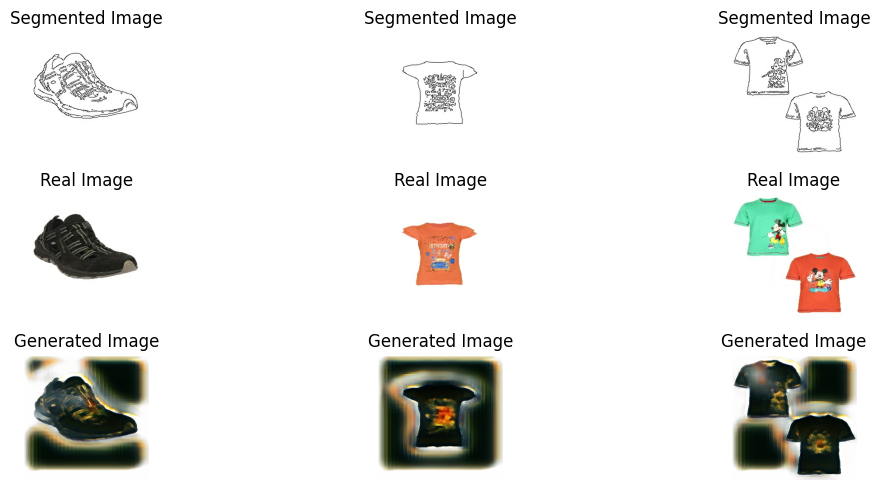

Epoch 71/200, Generator Loss: 8.648543357849121, Discriminator Loss: 0.22759173810482025, Pixel Distance: 0.2037663757801056
Epoch 72/200, Generator Loss: 12.719870567321777, Discriminator Loss: 0.20017510652542114, Pixel Distance: 0.2000100016593933
Epoch 73/200, Generator Loss: 20.1348876953125, Discriminator Loss: 0.19900532066822052, Pixel Distance: 0.22343243658542633
Epoch 74/200, Generator Loss: 22.535184860229492, Discriminator Loss: 0.04588509723544121, Pixel Distance: 0.23718976974487305
Epoch 75/200, Generator Loss: 16.05810546875, Discriminator Loss: 0.12216120958328247, Pixel Distance: 0.1776561141014099


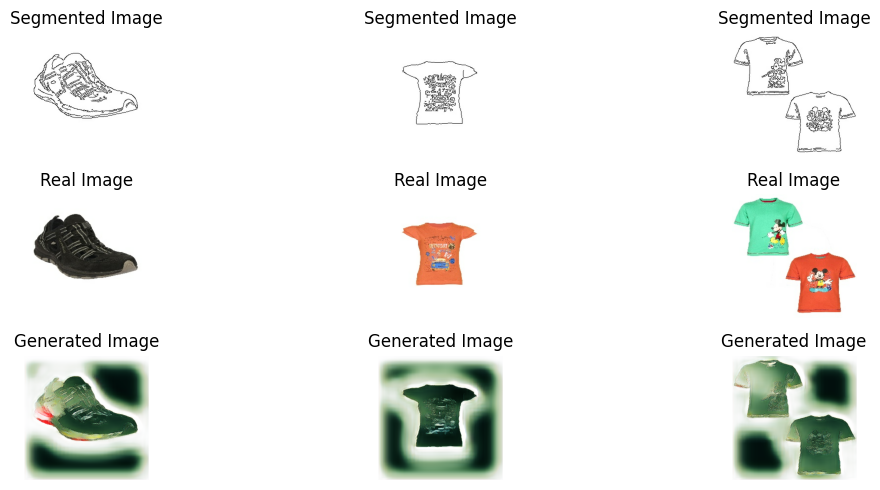

Epoch 76/200, Generator Loss: 5.377810955047607, Discriminator Loss: 0.31638601422309875, Pixel Distance: 0.1721201241016388
Epoch 77/200, Generator Loss: 37.271392822265625, Discriminator Loss: 0.1330009400844574, Pixel Distance: 0.23528262972831726
Epoch 78/200, Generator Loss: 24.168058395385742, Discriminator Loss: 0.07266992330551147, Pixel Distance: 0.21063706278800964
Epoch 79/200, Generator Loss: 3.0530707836151123, Discriminator Loss: 0.4737464189529419, Pixel Distance: 0.1756451278924942
Epoch 80/200, Generator Loss: 18.385513305664062, Discriminator Loss: 0.08508343249559402, Pixel Distance: 0.176160529255867


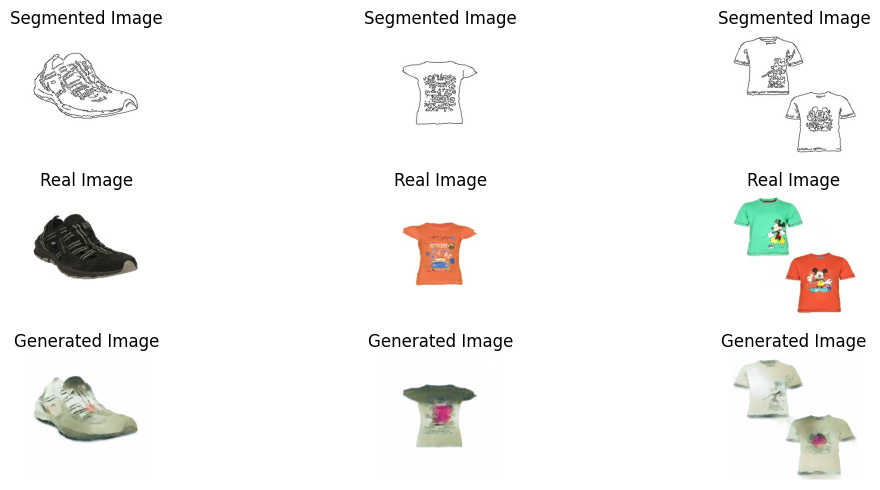

Epoch 81/200, Generator Loss: 9.040746688842773, Discriminator Loss: 0.1396256387233734, Pixel Distance: 0.16643668711185455
Epoch 82/200, Generator Loss: 5.313255786895752, Discriminator Loss: 0.4089003801345825, Pixel Distance: 0.2171349674463272
Epoch 83/200, Generator Loss: 11.027226448059082, Discriminator Loss: 0.30109867453575134, Pixel Distance: 0.22137580811977386
Epoch 84/200, Generator Loss: 6.972978591918945, Discriminator Loss: 0.416490375995636, Pixel Distance: 0.20202907919883728
Epoch 85/200, Generator Loss: 16.59440040588379, Discriminator Loss: 0.13597652316093445, Pixel Distance: 0.1984507143497467


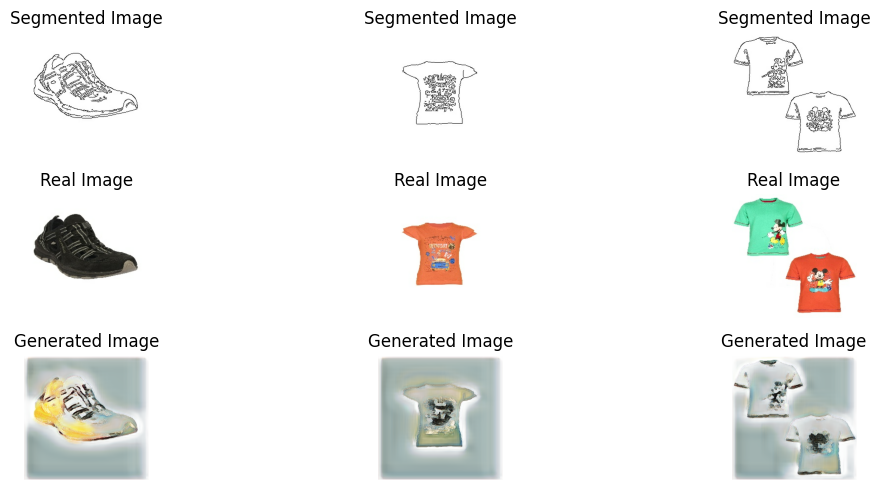

Epoch 86/200, Generator Loss: 26.4018497467041, Discriminator Loss: 0.2836798429489136, Pixel Distance: 0.17410023510456085
Epoch 87/200, Generator Loss: 10.763885498046875, Discriminator Loss: 0.20268034934997559, Pixel Distance: 0.16860546171665192
Epoch 88/200, Generator Loss: 8.828132629394531, Discriminator Loss: 0.26039066910743713, Pixel Distance: 0.1865505427122116
Epoch 89/200, Generator Loss: 5.4257354736328125, Discriminator Loss: 0.29116615653038025, Pixel Distance: 0.1580268144607544
Epoch 90/200, Generator Loss: 15.353896141052246, Discriminator Loss: 0.2892712354660034, Pixel Distance: 0.22459176182746887


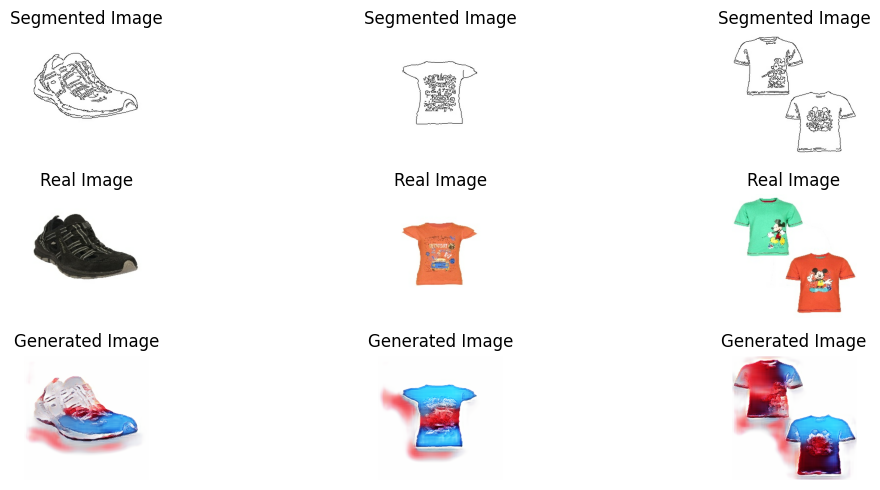

Epoch 91/200, Generator Loss: 2.7021334171295166, Discriminator Loss: 0.7365049719810486, Pixel Distance: 0.18645907938480377
Epoch 92/200, Generator Loss: 5.471320629119873, Discriminator Loss: 0.2792825996875763, Pixel Distance: 0.1765785962343216
Epoch 93/200, Generator Loss: 14.150879859924316, Discriminator Loss: 0.10053878277540207, Pixel Distance: 0.20388418436050415
Epoch 94/200, Generator Loss: 7.061525344848633, Discriminator Loss: 0.33512333035469055, Pixel Distance: 0.1724061369895935
Epoch 95/200, Generator Loss: 2.0840203762054443, Discriminator Loss: 0.6092329621315002, Pixel Distance: 0.1798715591430664


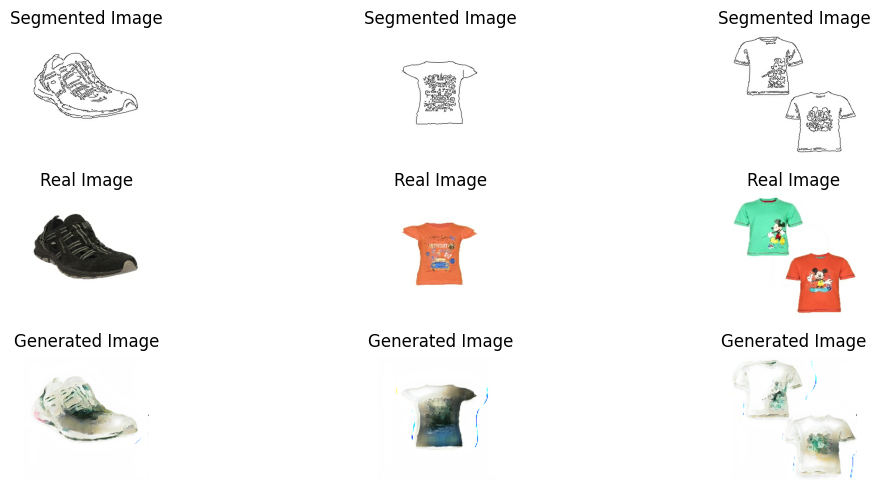

Epoch 96/200, Generator Loss: 25.743955612182617, Discriminator Loss: 0.1674371361732483, Pixel Distance: 0.24562782049179077
Epoch 97/200, Generator Loss: 2.982527732849121, Discriminator Loss: 0.7420558929443359, Pixel Distance: 0.17503802478313446
Epoch 98/200, Generator Loss: 10.619888305664062, Discriminator Loss: 0.2835111916065216, Pixel Distance: 0.20215986669063568
Epoch 99/200, Generator Loss: 10.121709823608398, Discriminator Loss: 0.20038147270679474, Pixel Distance: 0.19825322926044464
Epoch 100/200, Generator Loss: 7.679046154022217, Discriminator Loss: 0.22549337148666382, Pixel Distance: 0.17762726545333862


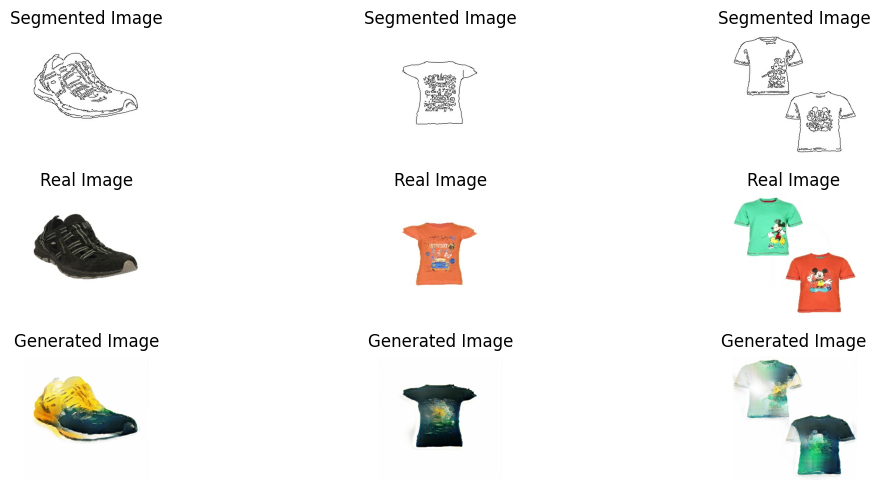

Epoch 101/200, Generator Loss: 8.916531562805176, Discriminator Loss: 0.2721990644931793, Pixel Distance: 0.1669573336839676
Epoch 102/200, Generator Loss: 12.444428443908691, Discriminator Loss: 0.12242215871810913, Pixel Distance: 0.14690834283828735
Epoch 103/200, Generator Loss: 5.323920249938965, Discriminator Loss: 0.4590514302253723, Pixel Distance: 0.17600701749324799
Epoch 104/200, Generator Loss: 8.90795612335205, Discriminator Loss: 0.27211177349090576, Pixel Distance: 0.17845416069030762
Epoch 105/200, Generator Loss: 28.156091690063477, Discriminator Loss: 0.3640058636665344, Pixel Distance: 0.21085971593856812


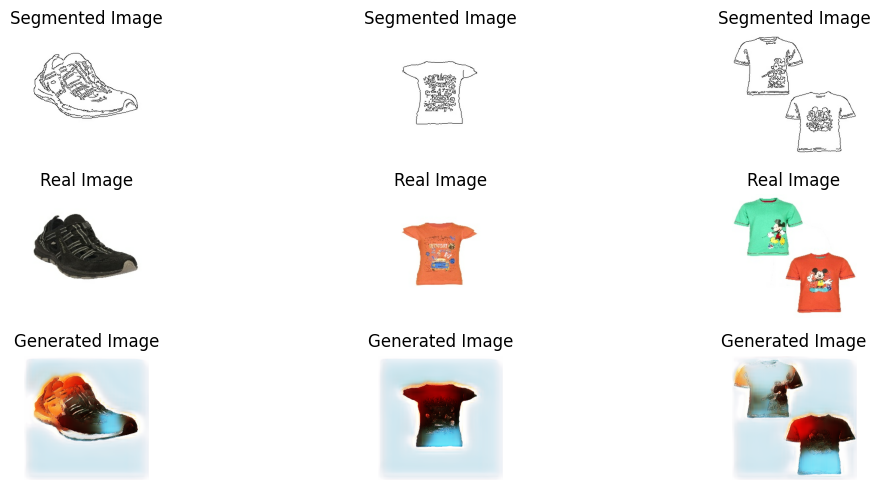

Epoch 106/200, Generator Loss: 9.859735488891602, Discriminator Loss: 0.18748609721660614, Pixel Distance: 0.20451150834560394
Epoch 107/200, Generator Loss: 12.93281078338623, Discriminator Loss: 0.18006622791290283, Pixel Distance: 0.1383872628211975
Epoch 108/200, Generator Loss: 4.514050483703613, Discriminator Loss: 1.3508832454681396, Pixel Distance: 0.1702953577041626
Epoch 109/200, Generator Loss: 6.582857131958008, Discriminator Loss: 0.5069261789321899, Pixel Distance: 0.202775776386261
Epoch 110/200, Generator Loss: 8.817583084106445, Discriminator Loss: 0.19534145295619965, Pixel Distance: 0.1816568821668625


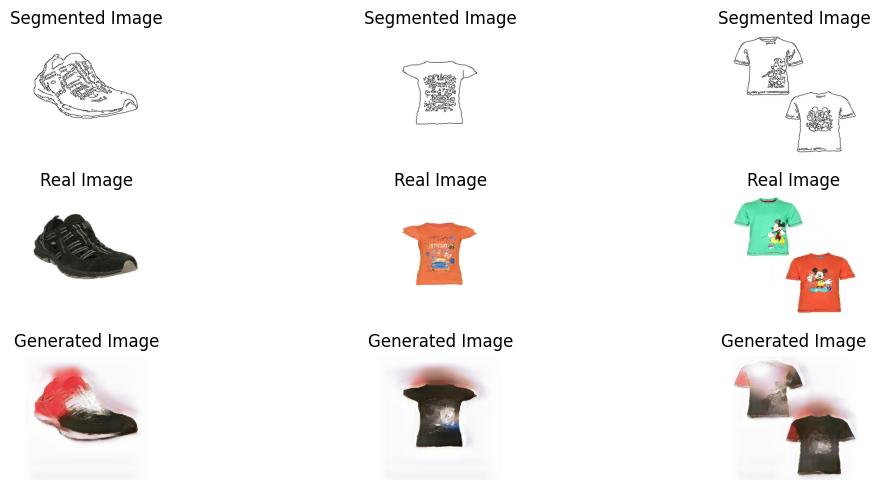

Epoch 111/200, Generator Loss: 4.999902248382568, Discriminator Loss: 0.3701067268848419, Pixel Distance: 0.17356419563293457
Epoch 112/200, Generator Loss: 8.307418823242188, Discriminator Loss: 0.47347384691238403, Pixel Distance: 0.17902253568172455
Epoch 113/200, Generator Loss: 15.178061485290527, Discriminator Loss: 0.11942864209413528, Pixel Distance: 0.22404561936855316
Epoch 114/200, Generator Loss: 10.059056282043457, Discriminator Loss: 0.21856287121772766, Pixel Distance: 0.1757899969816208
Epoch 115/200, Generator Loss: 8.448101043701172, Discriminator Loss: 0.3029535114765167, Pixel Distance: 0.20750027894973755


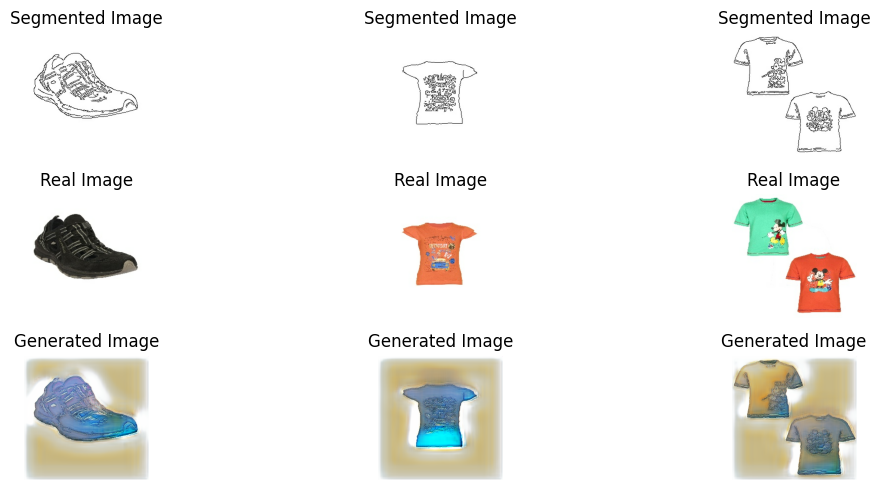

Epoch 116/200, Generator Loss: 3.0028505325317383, Discriminator Loss: 0.5112412571907043, Pixel Distance: 0.17859528958797455
Epoch 117/200, Generator Loss: 6.310548782348633, Discriminator Loss: 0.3331424593925476, Pixel Distance: 0.19256490468978882
Epoch 118/200, Generator Loss: 15.124469757080078, Discriminator Loss: 0.08375005424022675, Pixel Distance: 0.1611771583557129
Epoch 119/200, Generator Loss: 12.918274879455566, Discriminator Loss: 0.19327279925346375, Pixel Distance: 0.13995374739170074
Epoch 120/200, Generator Loss: 19.1964111328125, Discriminator Loss: 0.12397655844688416, Pixel Distance: 0.2007693648338318


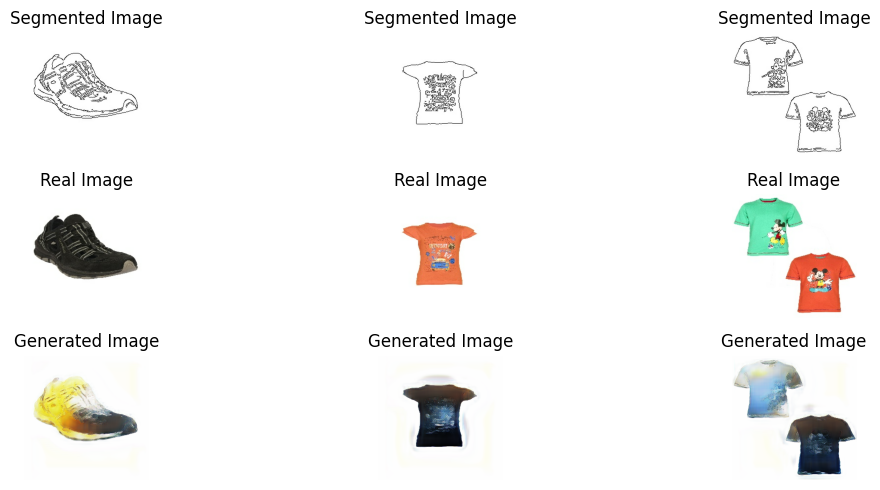

Epoch 121/200, Generator Loss: 7.825943470001221, Discriminator Loss: 0.19741171598434448, Pixel Distance: 0.1862228363752365
Epoch 122/200, Generator Loss: 9.16454792022705, Discriminator Loss: 0.1503450870513916, Pixel Distance: 0.1896282285451889
Epoch 123/200, Generator Loss: 4.231778621673584, Discriminator Loss: 0.41035252809524536, Pixel Distance: 0.15841837227344513
Epoch 124/200, Generator Loss: 4.634477615356445, Discriminator Loss: 0.5307183265686035, Pixel Distance: 0.16513517498970032
Epoch 125/200, Generator Loss: 4.225500106811523, Discriminator Loss: 0.49106624722480774, Pixel Distance: 0.1758679449558258


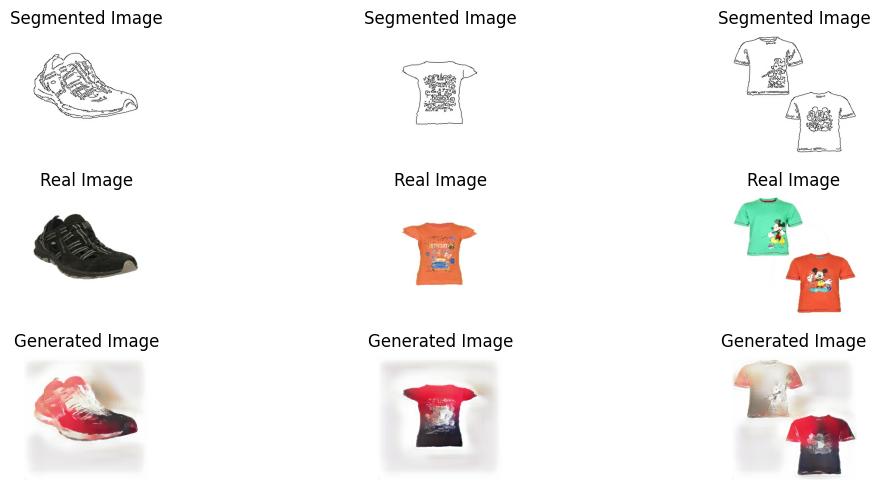

Epoch 126/200, Generator Loss: 6.170742511749268, Discriminator Loss: 0.5121050477027893, Pixel Distance: 0.17700497806072235
Epoch 127/200, Generator Loss: 10.323101997375488, Discriminator Loss: 0.24760329723358154, Pixel Distance: 0.2061053365468979
Epoch 128/200, Generator Loss: 6.732077121734619, Discriminator Loss: 0.2936083972454071, Pixel Distance: 0.17584770917892456
Epoch 129/200, Generator Loss: 11.181796073913574, Discriminator Loss: 0.2474445253610611, Pixel Distance: 0.16991710662841797
Epoch 130/200, Generator Loss: 3.3616933822631836, Discriminator Loss: 1.7980244159698486, Pixel Distance: 0.1871061772108078


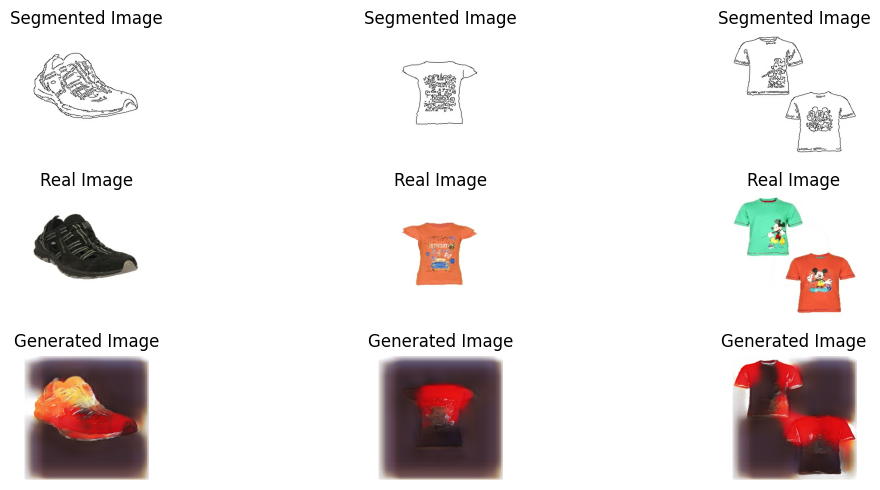

Epoch 131/200, Generator Loss: 16.252195358276367, Discriminator Loss: 0.0726967304944992, Pixel Distance: 0.1644652783870697
Epoch 132/200, Generator Loss: 20.367029190063477, Discriminator Loss: 0.6115375757217407, Pixel Distance: 0.20565791428089142
Epoch 133/200, Generator Loss: 28.96626853942871, Discriminator Loss: 0.02919512242078781, Pixel Distance: 0.22616587579250336
Epoch 134/200, Generator Loss: 13.163907051086426, Discriminator Loss: 0.1136273592710495, Pixel Distance: 0.1822749227285385
Epoch 135/200, Generator Loss: 14.161681175231934, Discriminator Loss: 0.44343382120132446, Pixel Distance: 0.17502912878990173


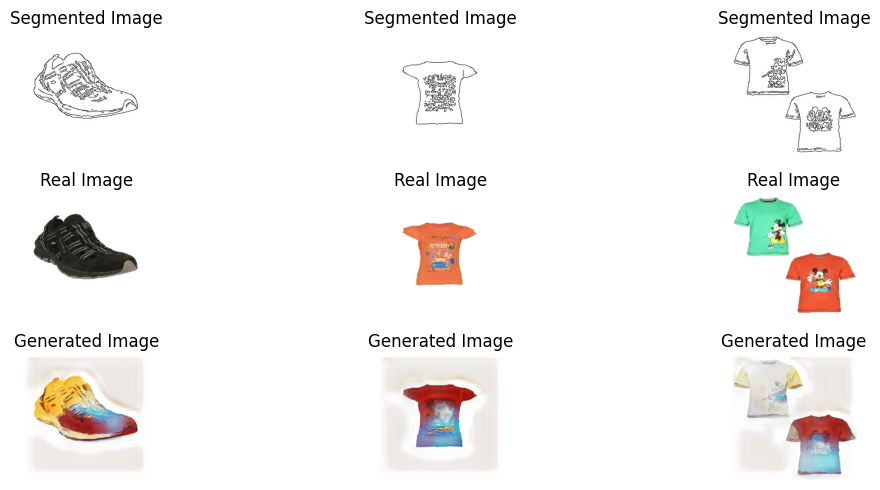

Epoch 136/200, Generator Loss: 7.4003753662109375, Discriminator Loss: 0.2722839415073395, Pixel Distance: 0.18728086352348328
Epoch 137/200, Generator Loss: 5.550861358642578, Discriminator Loss: 1.955976128578186, Pixel Distance: 0.16730749607086182
Epoch 138/200, Generator Loss: 8.93584156036377, Discriminator Loss: 0.1623801589012146, Pixel Distance: 0.19777201116085052
Epoch 139/200, Generator Loss: 7.335031986236572, Discriminator Loss: 0.24033960700035095, Pixel Distance: 0.18231521546840668
Epoch 140/200, Generator Loss: 1.889920711517334, Discriminator Loss: 1.2333585023880005, Pixel Distance: 0.17483095824718475


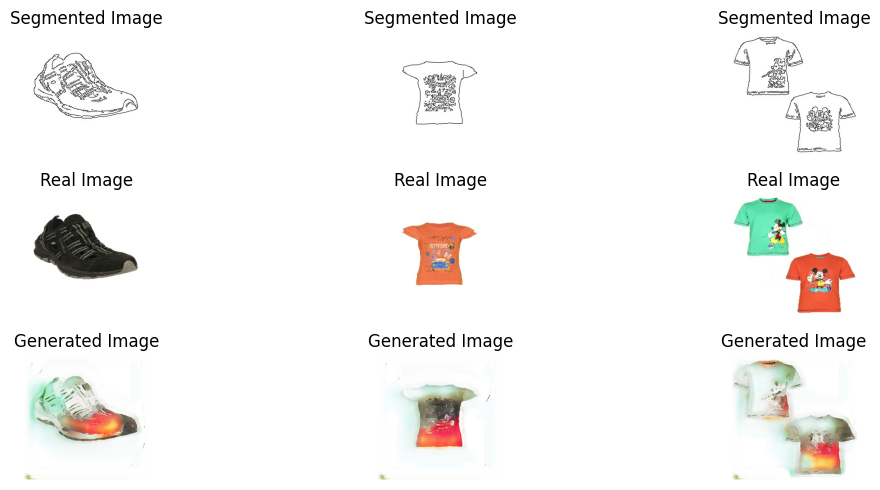

Epoch 141/200, Generator Loss: 3.2532527446746826, Discriminator Loss: 0.500906229019165, Pixel Distance: 0.18160022795200348
Epoch 142/200, Generator Loss: 9.628952026367188, Discriminator Loss: 0.1646808236837387, Pixel Distance: 0.21282321214675903
Epoch 143/200, Generator Loss: 24.59004783630371, Discriminator Loss: 0.044739656150341034, Pixel Distance: 0.18712647259235382
Epoch 144/200, Generator Loss: 13.915736198425293, Discriminator Loss: 0.09589867293834686, Pixel Distance: 0.1454402506351471
Epoch 145/200, Generator Loss: 33.31324768066406, Discriminator Loss: 0.38937926292419434, Pixel Distance: 0.255674809217453


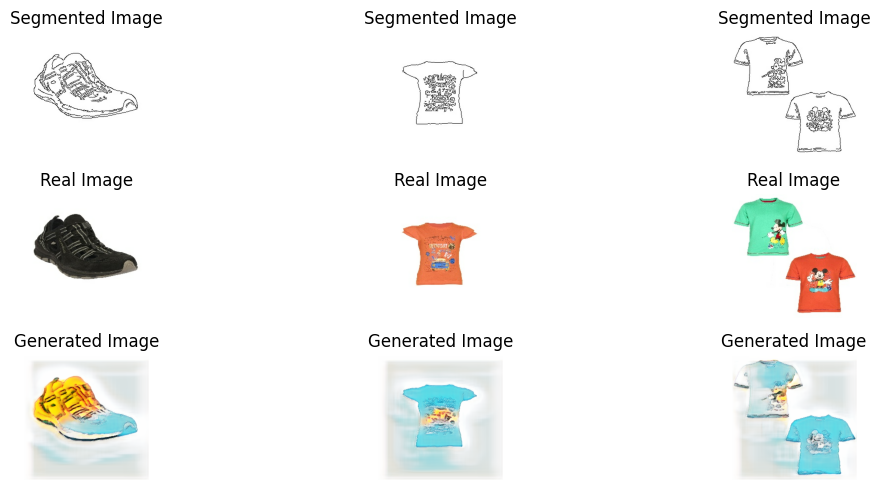

Epoch 146/200, Generator Loss: 17.39575958251953, Discriminator Loss: 0.08382381498813629, Pixel Distance: 0.1411454677581787
Epoch 147/200, Generator Loss: 10.276930809020996, Discriminator Loss: 0.1491643786430359, Pixel Distance: 0.18827036023139954
Epoch 148/200, Generator Loss: 4.097903728485107, Discriminator Loss: 0.5107766389846802, Pixel Distance: 0.18708695471286774
Epoch 149/200, Generator Loss: 5.02490758895874, Discriminator Loss: 0.41063088178634644, Pixel Distance: 0.19325710833072662
Epoch 150/200, Generator Loss: 6.414244174957275, Discriminator Loss: 0.5064964294433594, Pixel Distance: 0.22204643487930298


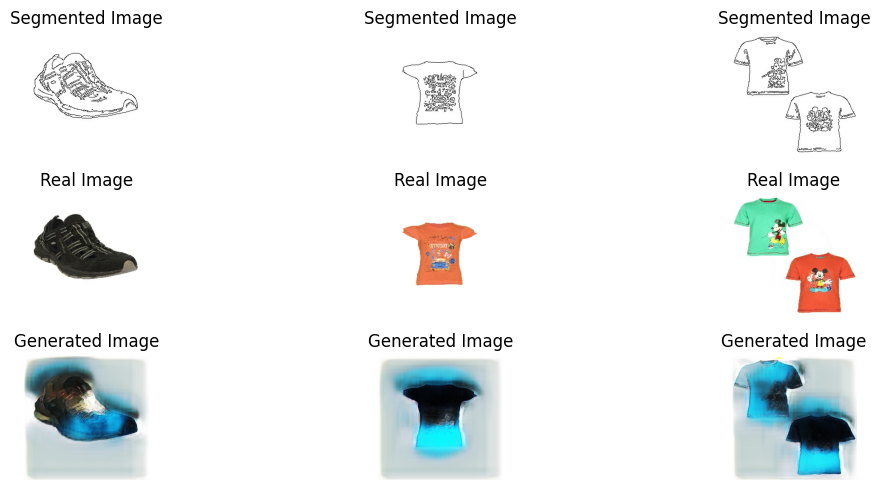

Epoch 151/200, Generator Loss: 12.38860034942627, Discriminator Loss: 0.14251844584941864, Pixel Distance: 0.132766991853714
Epoch 152/200, Generator Loss: 18.648115158081055, Discriminator Loss: 0.08760344237089157, Pixel Distance: 0.16883571445941925
Epoch 153/200, Generator Loss: 31.931699752807617, Discriminator Loss: 0.08292325586080551, Pixel Distance: 0.26966941356658936
Epoch 154/200, Generator Loss: 10.444278717041016, Discriminator Loss: 0.2931504249572754, Pixel Distance: 0.18414266407489777
Epoch 155/200, Generator Loss: 2.716449737548828, Discriminator Loss: 0.6784829497337341, Pixel Distance: 0.16561929881572723


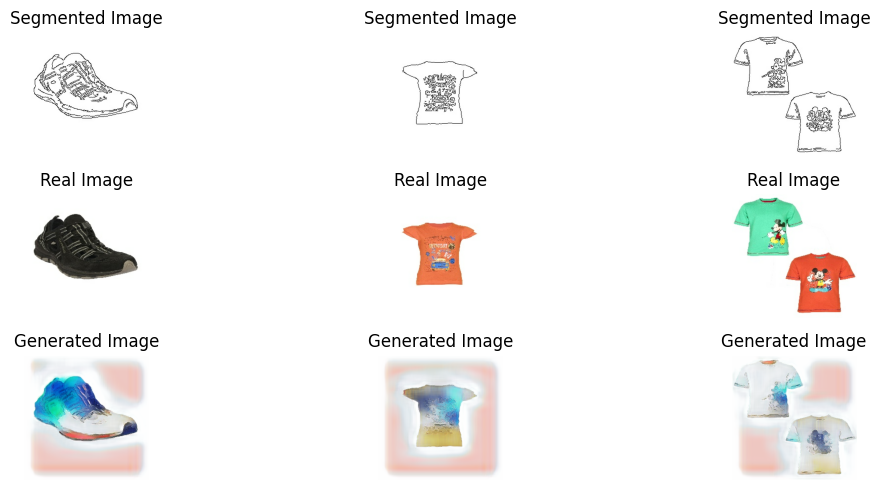

Epoch 156/200, Generator Loss: 13.411930084228516, Discriminator Loss: 0.7396981716156006, Pixel Distance: 0.19135643541812897
Epoch 157/200, Generator Loss: 5.32861852645874, Discriminator Loss: 0.3559553027153015, Pixel Distance: 0.17733271420001984
Epoch 158/200, Generator Loss: 7.897824764251709, Discriminator Loss: 0.3445051908493042, Pixel Distance: 0.17458680272102356
Epoch 159/200, Generator Loss: 3.7014572620391846, Discriminator Loss: 0.5654207468032837, Pixel Distance: 0.17370431125164032
Epoch 160/200, Generator Loss: 5.042632579803467, Discriminator Loss: 0.4312755763530731, Pixel Distance: 0.1875804215669632


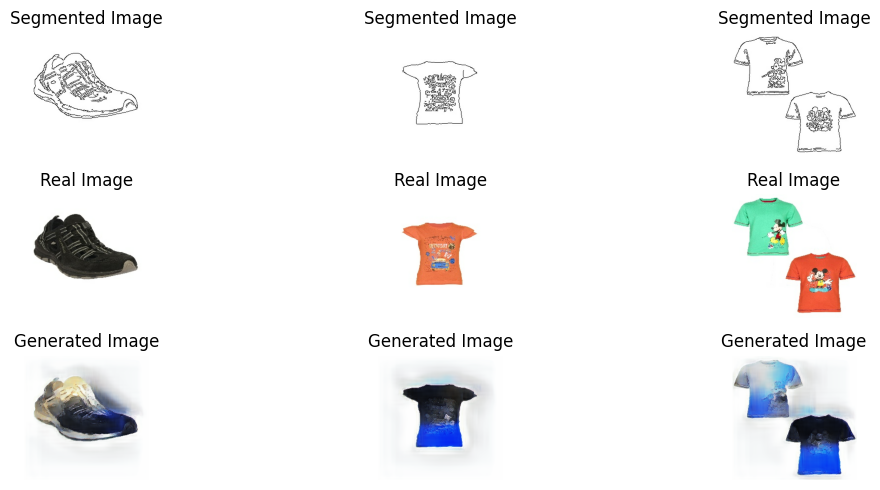

Epoch 161/200, Generator Loss: 12.669815063476562, Discriminator Loss: 0.22524870932102203, Pixel Distance: 0.1798907071352005
Epoch 162/200, Generator Loss: 4.273897171020508, Discriminator Loss: 0.576528012752533, Pixel Distance: 0.18114064633846283
Epoch 163/200, Generator Loss: 1.9936379194259644, Discriminator Loss: 0.8856345415115356, Pixel Distance: 0.16482821106910706
Epoch 164/200, Generator Loss: 10.113070487976074, Discriminator Loss: 0.18667393922805786, Pixel Distance: 0.18990708887577057
Epoch 165/200, Generator Loss: 6.852102756500244, Discriminator Loss: 0.24136772751808167, Pixel Distance: 0.19709989428520203


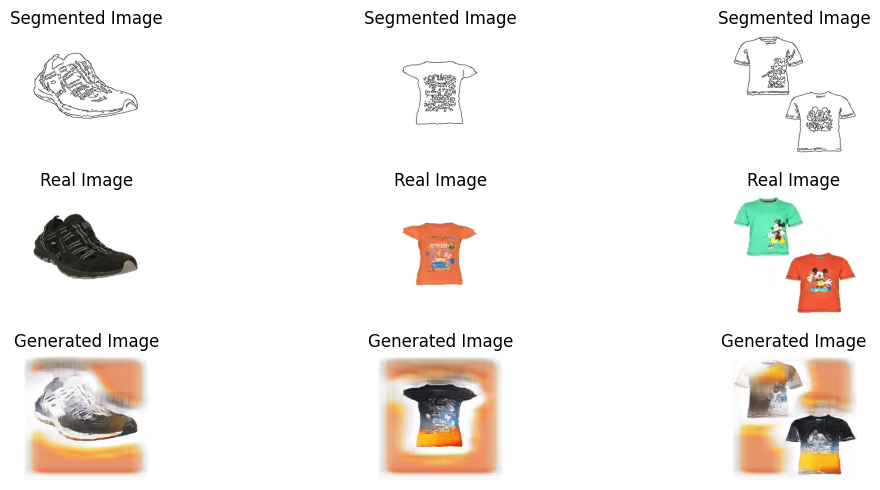

Epoch 166/200, Generator Loss: 2.8641605377197266, Discriminator Loss: 0.8444445133209229, Pixel Distance: 0.17284704744815826
Epoch 167/200, Generator Loss: 16.012964248657227, Discriminator Loss: 0.2123175859451294, Pixel Distance: 0.17354805767536163
Epoch 168/200, Generator Loss: 9.198016166687012, Discriminator Loss: 0.22413407266139984, Pixel Distance: 0.16404375433921814
Epoch 169/200, Generator Loss: 20.200864791870117, Discriminator Loss: 1.3364614248275757, Pixel Distance: 0.16914775967597961
Epoch 170/200, Generator Loss: 2.2432034015655518, Discriminator Loss: 0.9771026968955994, Pixel Distance: 0.16509085893630981


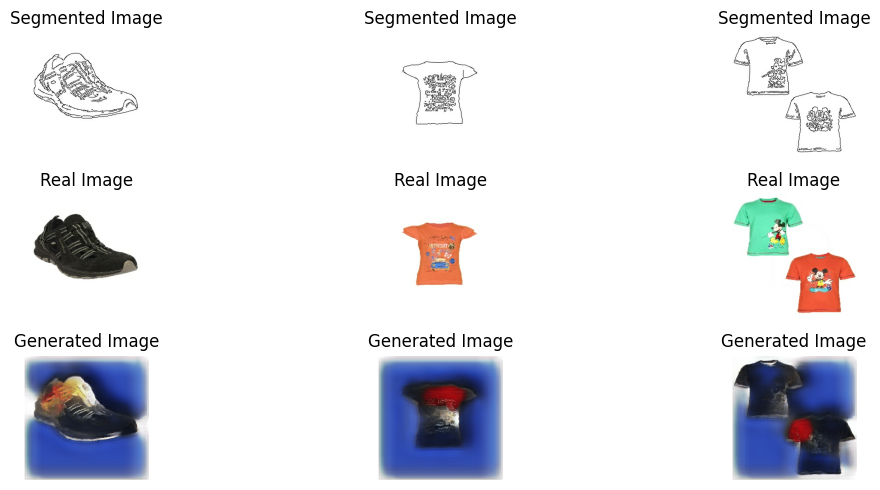

Epoch 171/200, Generator Loss: 3.1917264461517334, Discriminator Loss: 0.732033371925354, Pixel Distance: 0.17722100019454956
Epoch 172/200, Generator Loss: 12.699257850646973, Discriminator Loss: 0.20655092597007751, Pixel Distance: 0.17194387316703796
Epoch 173/200, Generator Loss: 8.823339462280273, Discriminator Loss: 0.25328952074050903, Pixel Distance: 0.15812616050243378
Epoch 174/200, Generator Loss: 4.831214427947998, Discriminator Loss: 0.4792635440826416, Pixel Distance: 0.16165651381015778
Epoch 175/200, Generator Loss: 2.979412078857422, Discriminator Loss: 2.0530576705932617, Pixel Distance: 0.15288013219833374


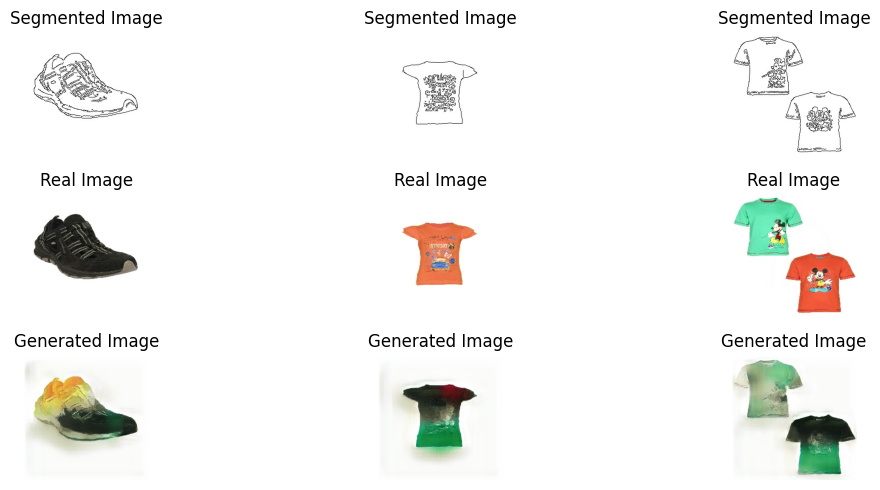

Epoch 176/200, Generator Loss: 2.369727849960327, Discriminator Loss: 0.6625472903251648, Pixel Distance: 0.22441482543945312
Epoch 177/200, Generator Loss: 27.97735595703125, Discriminator Loss: 0.2102939784526825, Pixel Distance: 0.15618747472763062
Epoch 178/200, Generator Loss: 5.839724063873291, Discriminator Loss: 0.42267677187919617, Pixel Distance: 0.1864769607782364
Epoch 179/200, Generator Loss: 4.467398166656494, Discriminator Loss: 0.4139910638332367, Pixel Distance: 0.21022500097751617
Epoch 180/200, Generator Loss: 9.5853853225708, Discriminator Loss: 0.31274303793907166, Pixel Distance: 0.20501099526882172


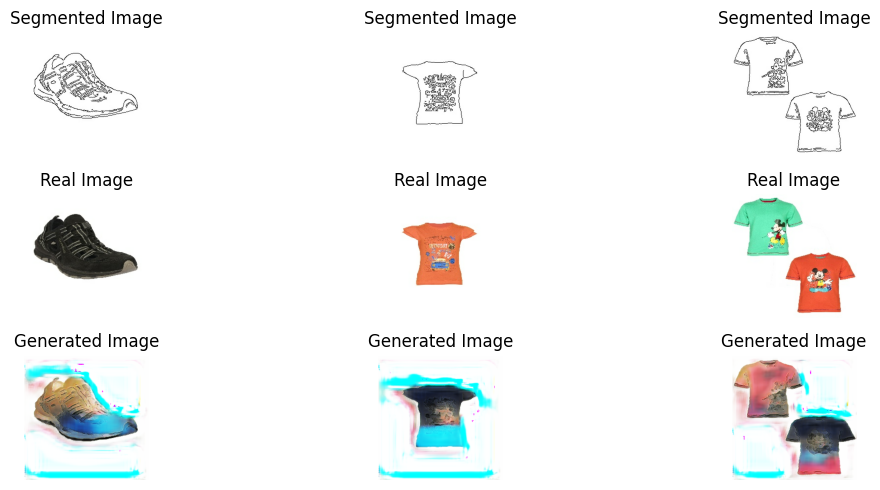

Epoch 181/200, Generator Loss: 2.1724143028259277, Discriminator Loss: 0.978310763835907, Pixel Distance: 0.20350557565689087
Epoch 182/200, Generator Loss: 12.698315620422363, Discriminator Loss: 0.13918733596801758, Pixel Distance: 0.15991121530532837
Epoch 183/200, Generator Loss: 10.205899238586426, Discriminator Loss: 0.4603322744369507, Pixel Distance: 0.17503295838832855
Epoch 184/200, Generator Loss: 8.466729164123535, Discriminator Loss: 0.5642186403274536, Pixel Distance: 0.18013454973697662
Epoch 185/200, Generator Loss: 3.1997902393341064, Discriminator Loss: 0.6282896995544434, Pixel Distance: 0.1652723252773285


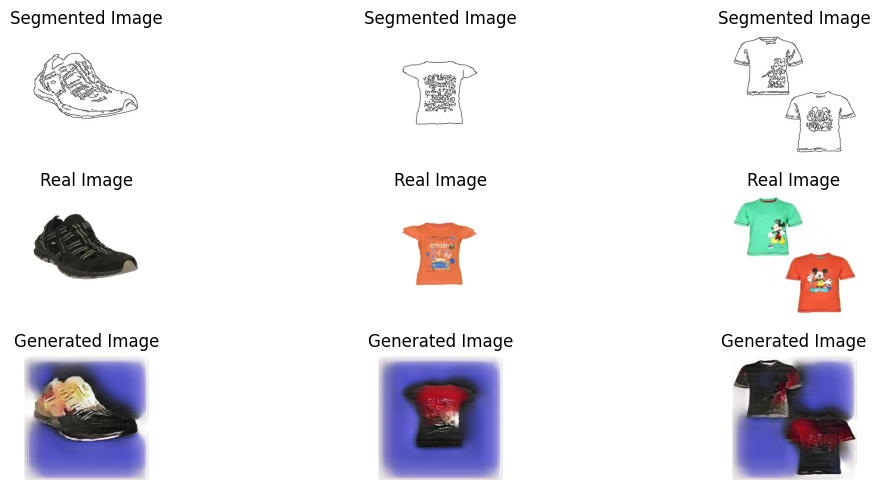

Epoch 186/200, Generator Loss: 22.162919998168945, Discriminator Loss: 0.2019335925579071, Pixel Distance: 0.1757560670375824
Epoch 187/200, Generator Loss: 2.06050705909729, Discriminator Loss: 1.0386872291564941, Pixel Distance: 0.1658088117837906
Epoch 188/200, Generator Loss: 4.9289422035217285, Discriminator Loss: 0.7323090434074402, Pixel Distance: 0.17266778647899628
Epoch 189/200, Generator Loss: 13.398601531982422, Discriminator Loss: 0.4208814799785614, Pixel Distance: 0.20446059107780457
Epoch 190/200, Generator Loss: 3.9510915279388428, Discriminator Loss: 1.806199550628662, Pixel Distance: 0.17792905867099762


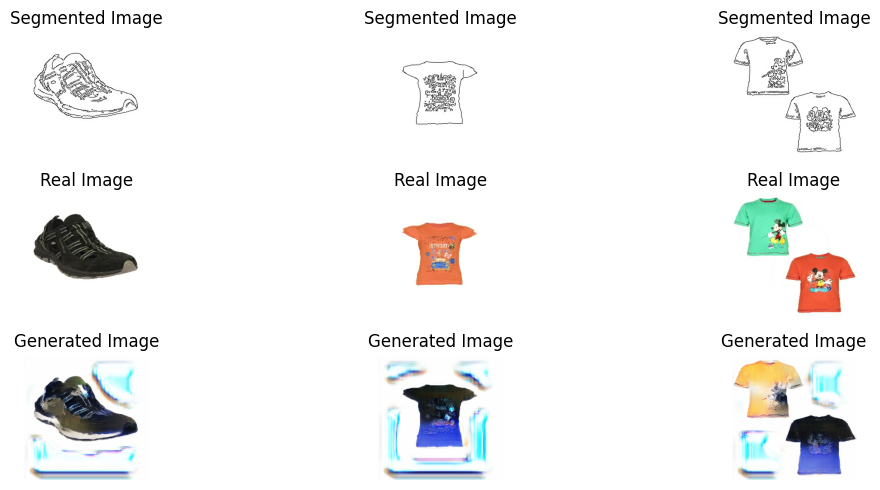

Epoch 191/200, Generator Loss: 2.0108723640441895, Discriminator Loss: 1.597985029220581, Pixel Distance: 0.17517490684986115
Epoch 192/200, Generator Loss: 6.009769439697266, Discriminator Loss: 0.8858187198638916, Pixel Distance: 0.1712593138217926
Epoch 193/200, Generator Loss: 6.714846134185791, Discriminator Loss: 0.4360191524028778, Pixel Distance: 0.16817863285541534
Epoch 194/200, Generator Loss: 2.5358965396881104, Discriminator Loss: 0.6515436768531799, Pixel Distance: 0.16957271099090576
Epoch 195/200, Generator Loss: 7.2102813720703125, Discriminator Loss: 0.2581038475036621, Pixel Distance: 0.1796155720949173


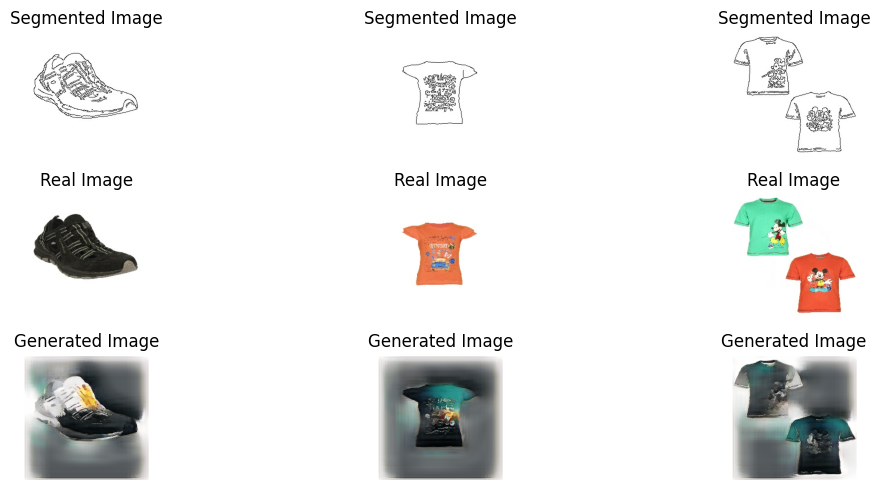

Epoch 196/200, Generator Loss: 20.815977096557617, Discriminator Loss: 0.4064518213272095, Pixel Distance: 0.1479535847902298
Epoch 197/200, Generator Loss: 17.973085403442383, Discriminator Loss: 0.37032443284988403, Pixel Distance: 0.16403812170028687
Epoch 198/200, Generator Loss: 4.94434118270874, Discriminator Loss: 0.7329495549201965, Pixel Distance: 0.1864228993654251
Epoch 199/200, Generator Loss: 1.7170861959457397, Discriminator Loss: 1.471919298171997, Pixel Distance: 0.1802375167608261
Epoch 200/200, Generator Loss: 7.925587177276611, Discriminator Loss: 0.1971215307712555, Pixel Distance: 0.1649474799633026


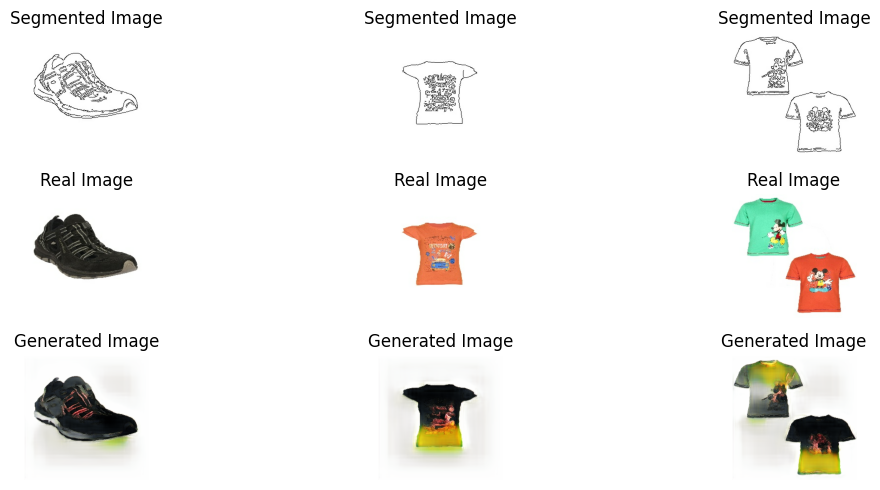

In [ ]:
epochs = 200
batch_size = 12
train_dataset = create_dataset(paired_paths)
# Train the pix2pix model
train_pix2pix(generator, discriminator, epochs, train_dataset, generator_optimizer, discriminator_optimizer, generator_loss, discriminator_loss)

Scenery

Epoch 1/200, Generator Loss: 0.6730489730834961, Discriminator Loss: 1.1578929424285889, Pixel Distance: 0.5451750159263611
Epoch 2/200, Generator Loss: 0.7752242088317871, Discriminator Loss: 0.8511642813682556, Pixel Distance: 0.5262128710746765
Epoch 3/200, Generator Loss: 1.3236894607543945, Discriminator Loss: 0.8350716233253479, Pixel Distance: 0.7106643319129944
Epoch 4/200, Generator Loss: 2.7586658000946045, Discriminator Loss: 0.7331504821777344, Pixel Distance: 0.4835575819015503
Epoch 5/200, Generator Loss: 3.619333028793335, Discriminator Loss: 1.352634310722351, Pixel Distance: 0.5861404538154602


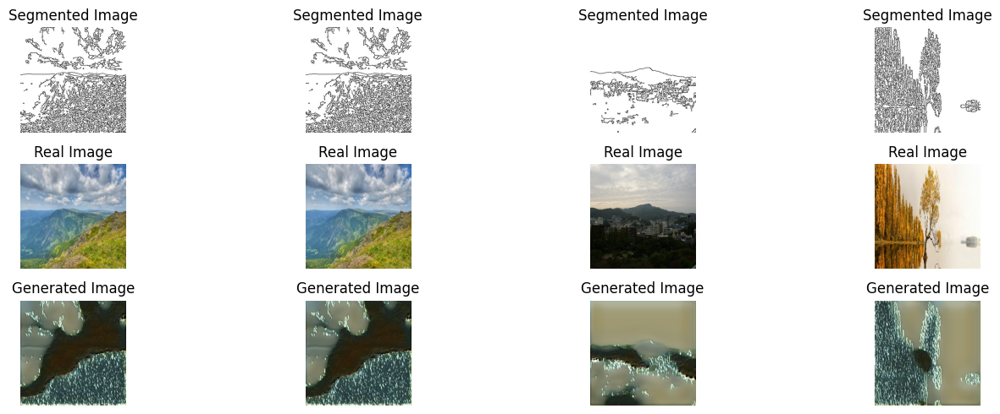

Epoch 6/200, Generator Loss: 2.543931484222412, Discriminator Loss: 1.1422905921936035, Pixel Distance: 0.5150080323219299
Epoch 7/200, Generator Loss: 0.7954356074333191, Discriminator Loss: 0.9047607183456421, Pixel Distance: 0.5269063115119934
Epoch 8/200, Generator Loss: 0.9527027010917664, Discriminator Loss: 0.6871696710586548, Pixel Distance: 0.5389016270637512
Epoch 9/200, Generator Loss: 2.266728639602661, Discriminator Loss: 0.44519466161727905, Pixel Distance: 0.5939679741859436
Epoch 10/200, Generator Loss: 8.597345352172852, Discriminator Loss: 1.283799409866333, Pixel Distance: 0.4834872782230377


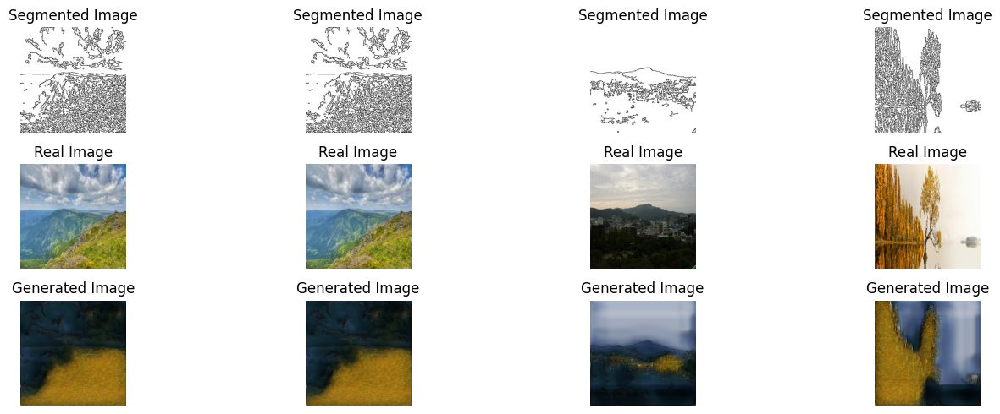

Epoch 11/200, Generator Loss: 3.2824513912200928, Discriminator Loss: 1.0615265369415283, Pixel Distance: 0.5610519051551819
Epoch 12/200, Generator Loss: 4.516901016235352, Discriminator Loss: 0.7851359844207764, Pixel Distance: 0.5628995299339294
Epoch 13/200, Generator Loss: 1.711007833480835, Discriminator Loss: 1.0210760831832886, Pixel Distance: 0.5307644009590149
Epoch 14/200, Generator Loss: 5.103118419647217, Discriminator Loss: 0.8637046217918396, Pixel Distance: 0.5780096650123596
Epoch 15/200, Generator Loss: 1.0596119165420532, Discriminator Loss: 1.082111120223999, Pixel Distance: 0.5128315687179565


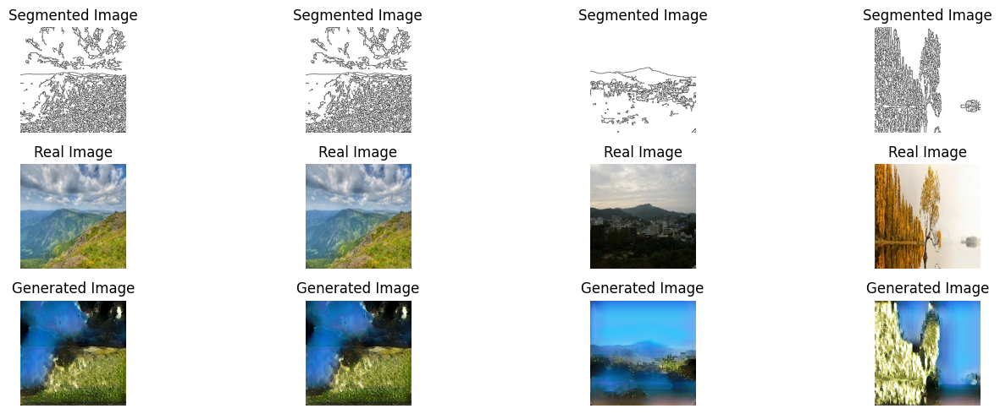

Epoch 16/200, Generator Loss: 0.8149909377098083, Discriminator Loss: 0.8318209648132324, Pixel Distance: 0.6101935505867004
Epoch 17/200, Generator Loss: 0.9932966232299805, Discriminator Loss: 1.0683839321136475, Pixel Distance: 0.6508002877235413
Epoch 18/200, Generator Loss: 6.764570236206055, Discriminator Loss: 1.4715015888214111, Pixel Distance: 0.4474191665649414
Epoch 19/200, Generator Loss: 1.1539030075073242, Discriminator Loss: 0.7323208451271057, Pixel Distance: 0.6454904675483704
Epoch 20/200, Generator Loss: 3.2762808799743652, Discriminator Loss: 1.0248562097549438, Pixel Distance: 0.5338775515556335


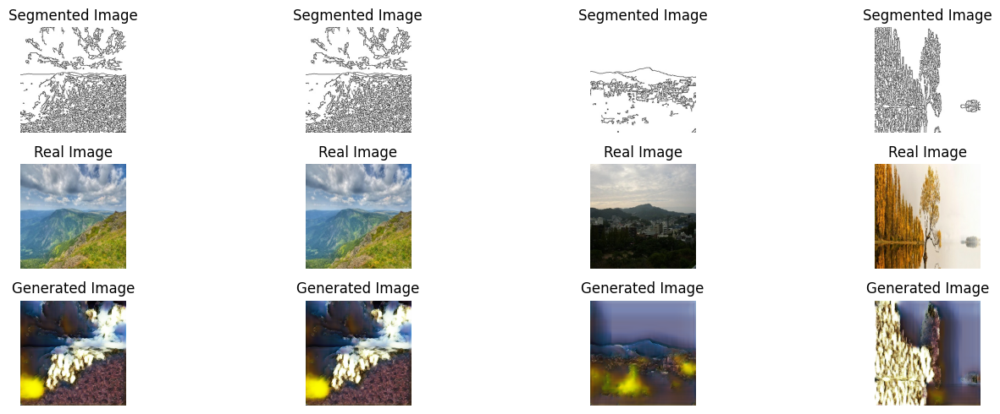

Epoch 21/200, Generator Loss: 2.019711971282959, Discriminator Loss: 0.9358412623405457, Pixel Distance: 0.562515914440155
Epoch 22/200, Generator Loss: 5.008359432220459, Discriminator Loss: 0.9921978116035461, Pixel Distance: 0.5168600678443909
Epoch 23/200, Generator Loss: 2.7470521926879883, Discriminator Loss: 0.7405365109443665, Pixel Distance: 0.5514587163925171
Epoch 24/200, Generator Loss: 3.270454168319702, Discriminator Loss: 1.1994532346725464, Pixel Distance: 0.4247142970561981
Epoch 25/200, Generator Loss: 1.916901707649231, Discriminator Loss: 0.772501528263092, Pixel Distance: 0.6980000138282776


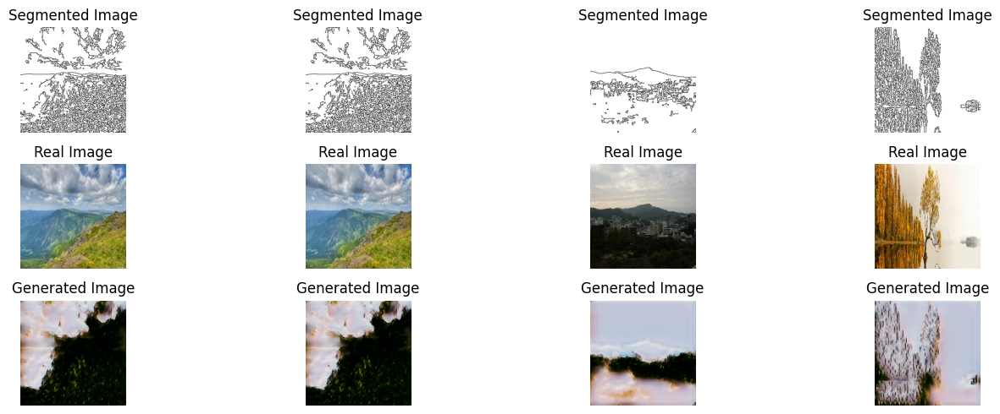

Epoch 26/200, Generator Loss: 3.8526902198791504, Discriminator Loss: 1.9063845872879028, Pixel Distance: 0.43598470091819763
Epoch 27/200, Generator Loss: 2.6142289638519287, Discriminator Loss: 0.833947479724884, Pixel Distance: 0.48734763264656067
Epoch 28/200, Generator Loss: 3.785388469696045, Discriminator Loss: 1.0486786365509033, Pixel Distance: 0.4459373950958252
Epoch 29/200, Generator Loss: 2.0426251888275146, Discriminator Loss: 1.1171600818634033, Pixel Distance: 0.6210545897483826
Epoch 30/200, Generator Loss: 6.684054851531982, Discriminator Loss: 0.3163190484046936, Pixel Distance: 0.6112770438194275


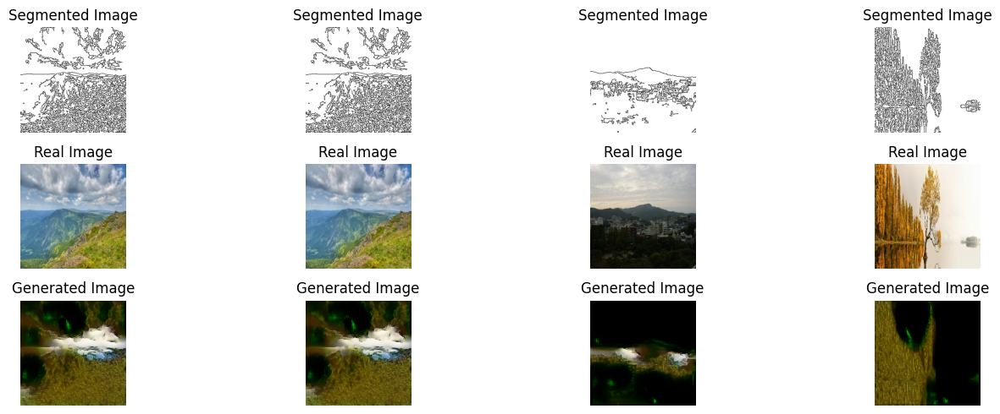

Epoch 31/200, Generator Loss: 3.6669085025787354, Discriminator Loss: 0.9610169529914856, Pixel Distance: 0.5646795630455017
Epoch 32/200, Generator Loss: 5.661414623260498, Discriminator Loss: 1.471348524093628, Pixel Distance: 0.4542308747768402
Epoch 33/200, Generator Loss: 10.387280464172363, Discriminator Loss: 0.4488833248615265, Pixel Distance: 0.43603256344795227
Epoch 34/200, Generator Loss: 3.0842268466949463, Discriminator Loss: 0.5161306262016296, Pixel Distance: 0.6595479846000671
Epoch 35/200, Generator Loss: 2.422614097595215, Discriminator Loss: 0.548115074634552, Pixel Distance: 0.6056085228919983


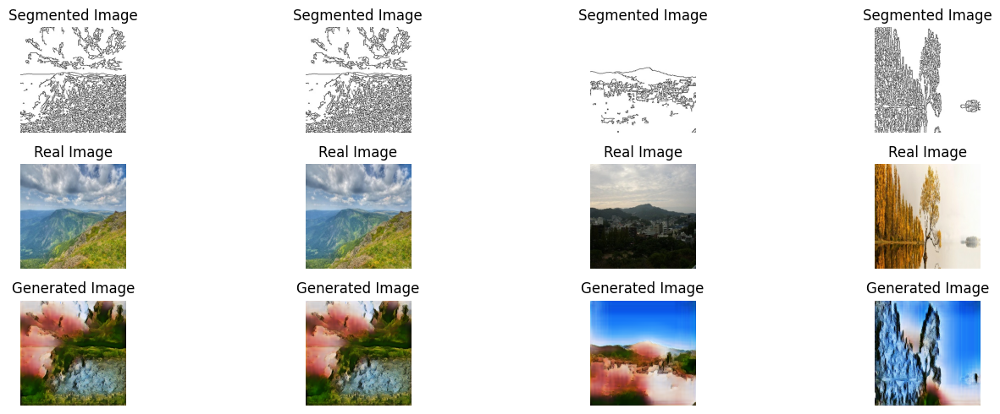

Epoch 36/200, Generator Loss: 4.321712493896484, Discriminator Loss: 1.5974104404449463, Pixel Distance: 0.41341671347618103
Epoch 37/200, Generator Loss: 3.586329936981201, Discriminator Loss: 0.6644926071166992, Pixel Distance: 0.5148913264274597
Epoch 38/200, Generator Loss: 1.6512762308120728, Discriminator Loss: 0.766258716583252, Pixel Distance: 0.514818012714386
Epoch 39/200, Generator Loss: 1.9978766441345215, Discriminator Loss: 1.4063924551010132, Pixel Distance: 0.6174478530883789
Epoch 40/200, Generator Loss: 7.32939338684082, Discriminator Loss: 0.23510685563087463, Pixel Distance: 0.6229009032249451


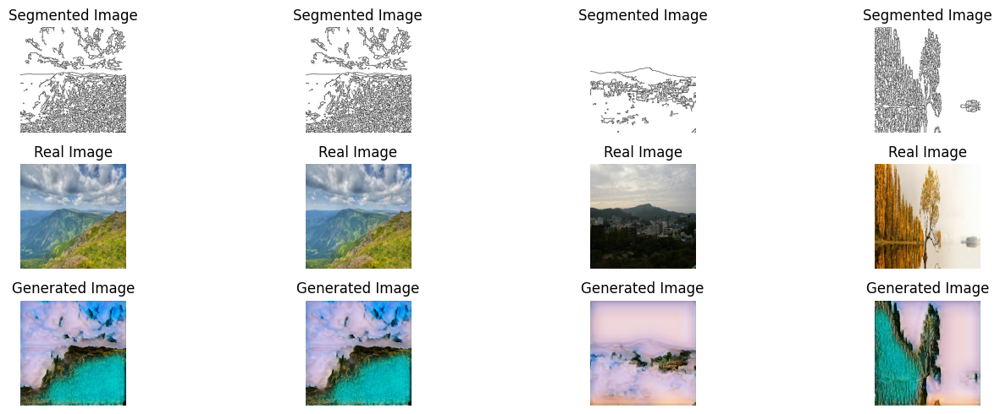

Epoch 41/200, Generator Loss: 4.153031826019287, Discriminator Loss: 0.6747395992279053, Pixel Distance: 0.7182477116584778
Epoch 42/200, Generator Loss: 27.64752197265625, Discriminator Loss: 2.7454285621643066, Pixel Distance: 0.5130882859230042
Epoch 43/200, Generator Loss: 3.125805139541626, Discriminator Loss: 2.209016799926758, Pixel Distance: 0.4166337251663208
Epoch 44/200, Generator Loss: 6.943849086761475, Discriminator Loss: 2.7483935356140137, Pixel Distance: 0.41123247146606445
Epoch 45/200, Generator Loss: 2.433495283126831, Discriminator Loss: 1.6205997467041016, Pixel Distance: 0.4321644604206085


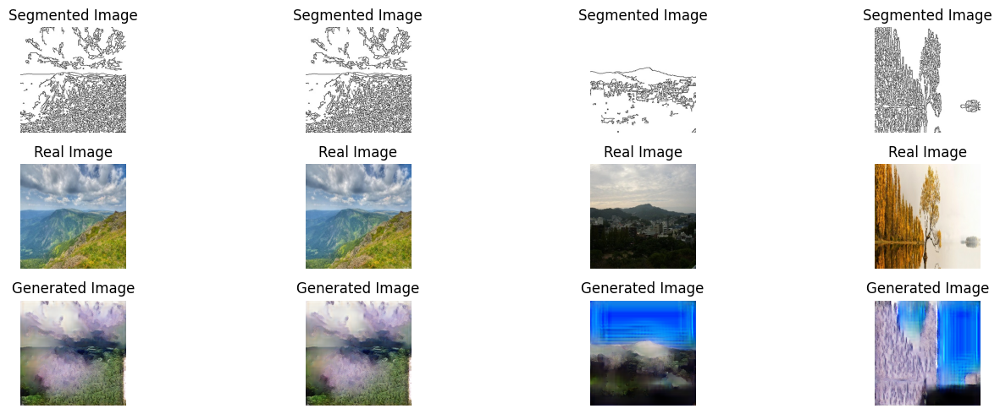

Epoch 46/200, Generator Loss: 3.8433313369750977, Discriminator Loss: 0.605269730091095, Pixel Distance: 0.498396635055542
Epoch 47/200, Generator Loss: 7.399698257446289, Discriminator Loss: 1.1379246711730957, Pixel Distance: 0.6189303994178772
Epoch 48/200, Generator Loss: 3.52221941947937, Discriminator Loss: 1.7693383693695068, Pixel Distance: 0.45591017603874207
Epoch 49/200, Generator Loss: 2.2815680503845215, Discriminator Loss: 0.8607455492019653, Pixel Distance: 0.4324500858783722
Epoch 50/200, Generator Loss: 1.265709400177002, Discriminator Loss: 1.0873079299926758, Pixel Distance: 0.5948130488395691


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


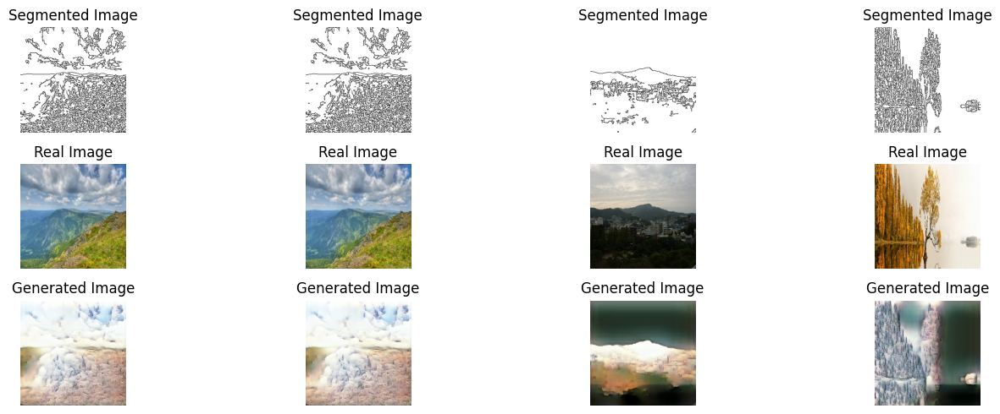

Epoch 51/200, Generator Loss: 4.525520324707031, Discriminator Loss: 0.33715376257896423, Pixel Distance: 0.4654834270477295
Epoch 52/200, Generator Loss: 2.0354464054107666, Discriminator Loss: 0.6883281469345093, Pixel Distance: 0.5596229434013367
Epoch 53/200, Generator Loss: 2.860091209411621, Discriminator Loss: 0.4981546401977539, Pixel Distance: 0.47243908047676086
Epoch 54/200, Generator Loss: 9.286247253417969, Discriminator Loss: 0.274709552526474, Pixel Distance: 0.5215432047843933
Epoch 55/200, Generator Loss: 7.9832329750061035, Discriminator Loss: 0.21661372482776642, Pixel Distance: 0.6241456866264343


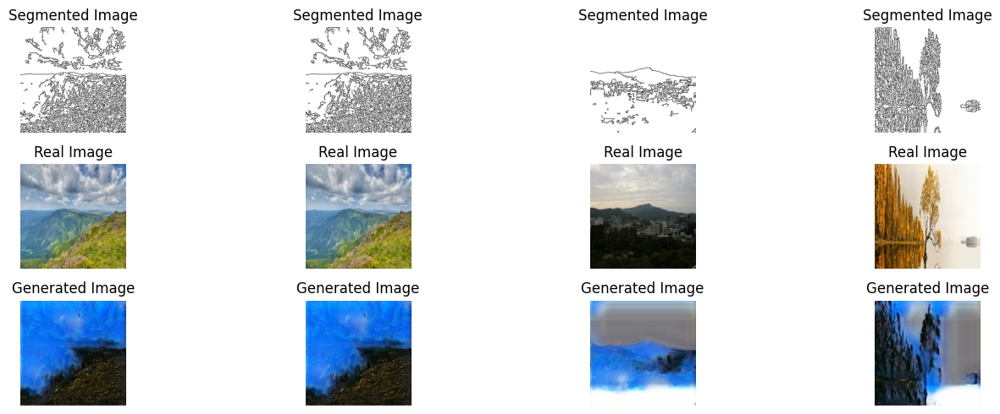

Epoch 56/200, Generator Loss: 6.515015602111816, Discriminator Loss: 0.2494736611843109, Pixel Distance: 0.5622938871383667
Epoch 57/200, Generator Loss: 4.040683269500732, Discriminator Loss: 0.41458338499069214, Pixel Distance: 0.49262598156929016
Epoch 58/200, Generator Loss: 2.474663734436035, Discriminator Loss: 0.38601863384246826, Pixel Distance: 0.457931786775589
Epoch 59/200, Generator Loss: 3.7453670501708984, Discriminator Loss: 1.4392356872558594, Pixel Distance: 0.4088957607746124
Epoch 60/200, Generator Loss: 6.496409893035889, Discriminator Loss: 0.3251919746398926, Pixel Distance: 0.4685460031032562


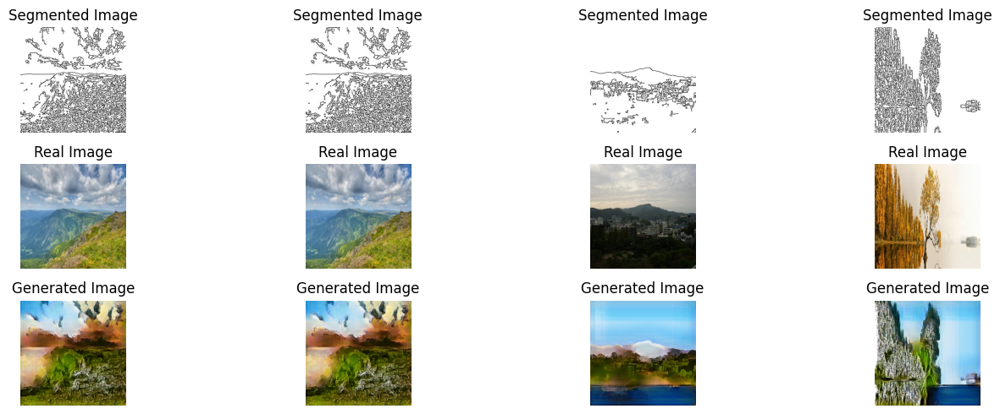

Epoch 61/200, Generator Loss: 4.966967582702637, Discriminator Loss: 1.0337960720062256, Pixel Distance: 0.554809033870697
Epoch 62/200, Generator Loss: 1.8973075151443481, Discriminator Loss: 1.287201166152954, Pixel Distance: 0.44238802790641785
Epoch 63/200, Generator Loss: 2.2270331382751465, Discriminator Loss: 1.719649076461792, Pixel Distance: 0.4370048940181732
Epoch 64/200, Generator Loss: 3.0554237365722656, Discriminator Loss: 0.45755285024642944, Pixel Distance: 0.5054342746734619
Epoch 65/200, Generator Loss: 3.9594340324401855, Discriminator Loss: 0.8549050092697144, Pixel Distance: 0.5163187980651855


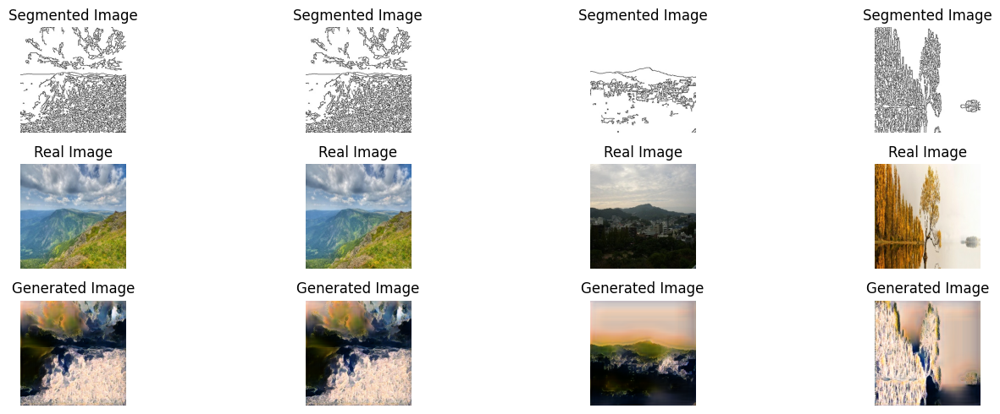

Epoch 66/200, Generator Loss: 4.104695796966553, Discriminator Loss: 0.5927635431289673, Pixel Distance: 0.4041774570941925
Epoch 67/200, Generator Loss: 1.4000871181488037, Discriminator Loss: 0.965714693069458, Pixel Distance: 0.40402451157569885
Epoch 68/200, Generator Loss: 5.854889392852783, Discriminator Loss: 0.25499534606933594, Pixel Distance: 0.639073371887207
Epoch 69/200, Generator Loss: 7.8344926834106445, Discriminator Loss: 0.19074437022209167, Pixel Distance: 0.5551900863647461
Epoch 70/200, Generator Loss: 9.811830520629883, Discriminator Loss: 0.22569309175014496, Pixel Distance: 0.6427456736564636


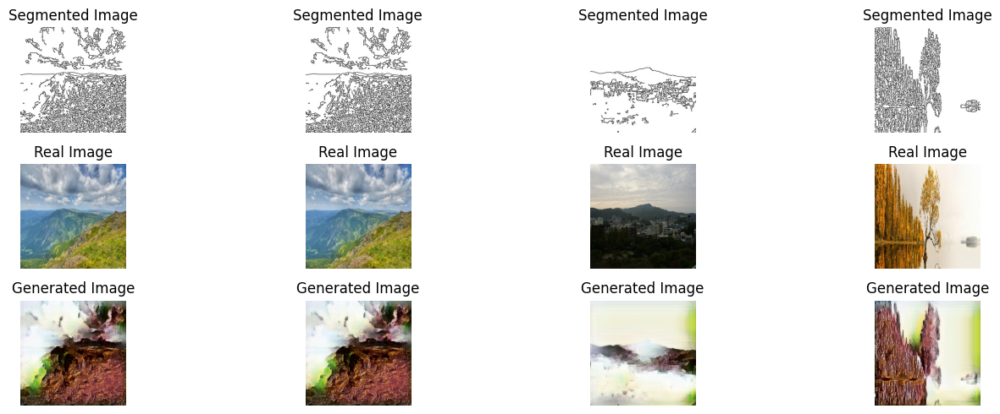

Epoch 71/200, Generator Loss: 2.360123634338379, Discriminator Loss: 0.8475267887115479, Pixel Distance: 0.6031861901283264
Epoch 72/200, Generator Loss: 5.810871124267578, Discriminator Loss: 0.7924512624740601, Pixel Distance: 0.4483931064605713
Epoch 73/200, Generator Loss: 2.36008620262146, Discriminator Loss: 1.2562339305877686, Pixel Distance: 0.38794997334480286
Epoch 74/200, Generator Loss: 3.5539259910583496, Discriminator Loss: 1.2404747009277344, Pixel Distance: 0.45584988594055176
Epoch 75/200, Generator Loss: 1.5252504348754883, Discriminator Loss: 1.001681923866272, Pixel Distance: 0.4305554926395416


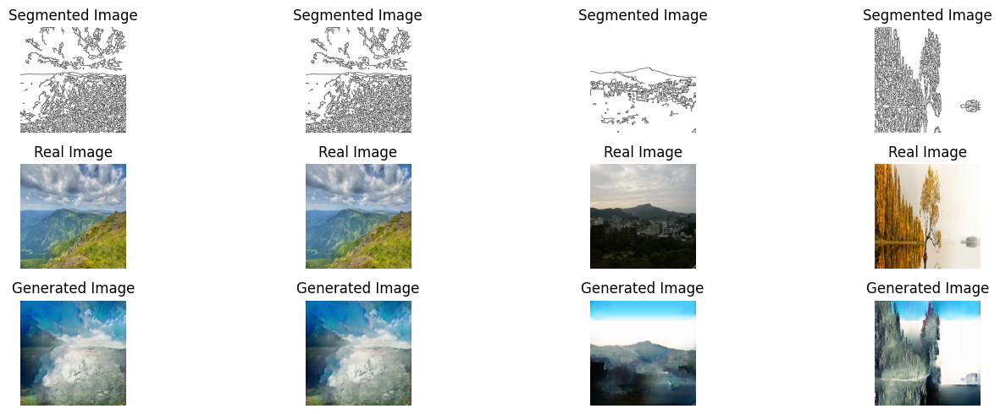

Epoch 76/200, Generator Loss: 11.600154876708984, Discriminator Loss: 0.4669348895549774, Pixel Distance: 0.4771132469177246
Epoch 77/200, Generator Loss: 2.258763074874878, Discriminator Loss: 1.4667232036590576, Pixel Distance: 0.4102655351161957
Epoch 78/200, Generator Loss: 7.514364242553711, Discriminator Loss: 0.5738840103149414, Pixel Distance: 0.4889144003391266
Epoch 79/200, Generator Loss: 9.066547393798828, Discriminator Loss: 0.39199700951576233, Pixel Distance: 0.5520203113555908
Epoch 80/200, Generator Loss: 3.9001893997192383, Discriminator Loss: 0.42658597230911255, Pixel Distance: 0.47464942932128906


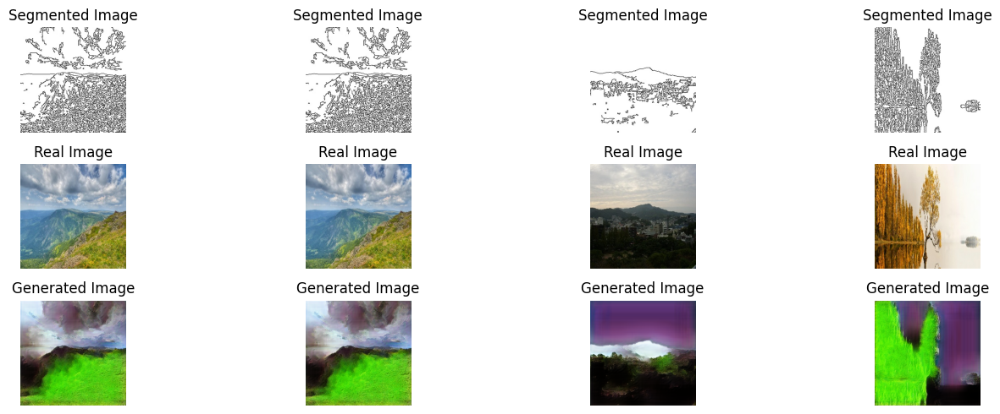

Epoch 81/200, Generator Loss: 1.4849803447723389, Discriminator Loss: 1.091601848602295, Pixel Distance: 0.3969525098800659
Epoch 82/200, Generator Loss: 9.830750465393066, Discriminator Loss: 0.28013062477111816, Pixel Distance: 0.6321501135826111
Epoch 83/200, Generator Loss: 5.104101181030273, Discriminator Loss: 0.5612078309059143, Pixel Distance: 0.4714614152908325
Epoch 84/200, Generator Loss: 1.4589229822158813, Discriminator Loss: 1.371274471282959, Pixel Distance: 0.478731244802475
Epoch 85/200, Generator Loss: 2.3902666568756104, Discriminator Loss: 1.0874766111373901, Pixel Distance: 0.4669324457645416


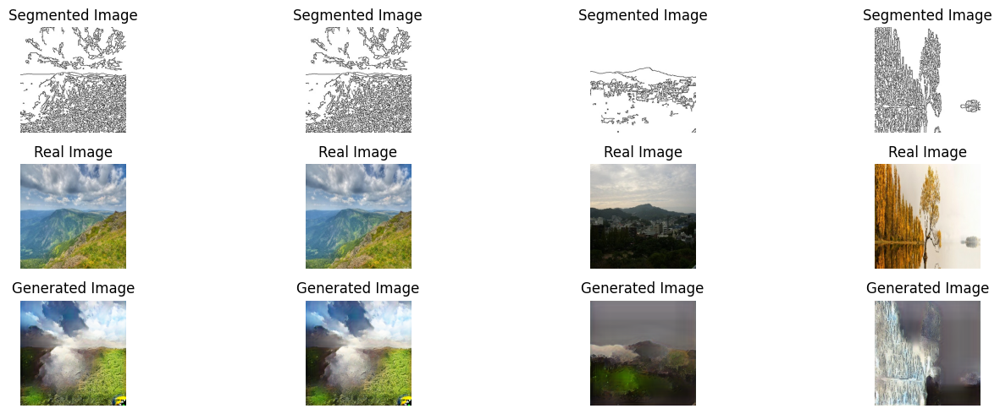

Epoch 86/200, Generator Loss: 2.9619245529174805, Discriminator Loss: 1.1478190422058105, Pixel Distance: 0.47208666801452637
Epoch 87/200, Generator Loss: 1.4493279457092285, Discriminator Loss: 1.2960340976715088, Pixel Distance: 0.4913816452026367
Epoch 88/200, Generator Loss: 1.5453548431396484, Discriminator Loss: 1.1643118858337402, Pixel Distance: 0.45158132910728455
Epoch 89/200, Generator Loss: 1.4983547925949097, Discriminator Loss: 1.0793871879577637, Pixel Distance: 0.4416489601135254
Epoch 90/200, Generator Loss: 7.656680107116699, Discriminator Loss: 2.9092493057250977, Pixel Distance: 0.4315973222255707


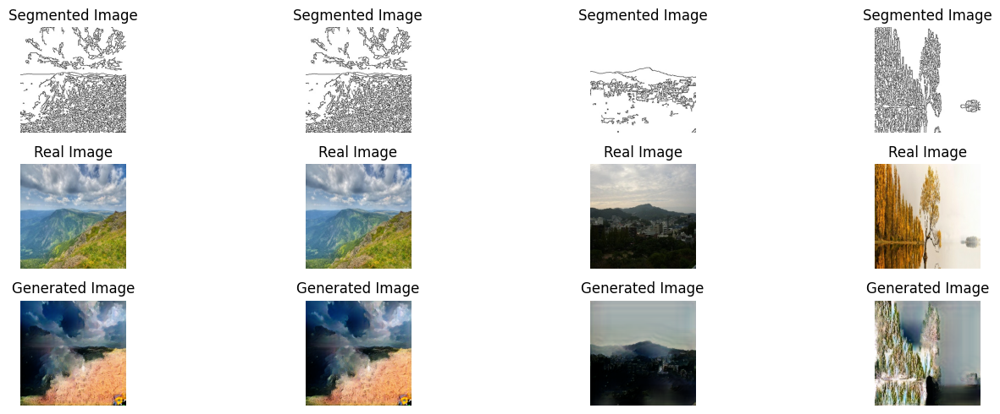

Epoch 91/200, Generator Loss: 1.7121316194534302, Discriminator Loss: 0.8702242374420166, Pixel Distance: 0.4410679340362549
Epoch 92/200, Generator Loss: 2.3362467288970947, Discriminator Loss: 1.570245385169983, Pixel Distance: 0.4264291226863861
Epoch 93/200, Generator Loss: 2.0135908126831055, Discriminator Loss: 1.5956363677978516, Pixel Distance: 0.4625221788883209
Epoch 94/200, Generator Loss: 1.07058584690094, Discriminator Loss: 1.555724024772644, Pixel Distance: 0.44251319766044617
Epoch 95/200, Generator Loss: 3.643641948699951, Discriminator Loss: 0.8136956095695496, Pixel Distance: 0.41790294647216797


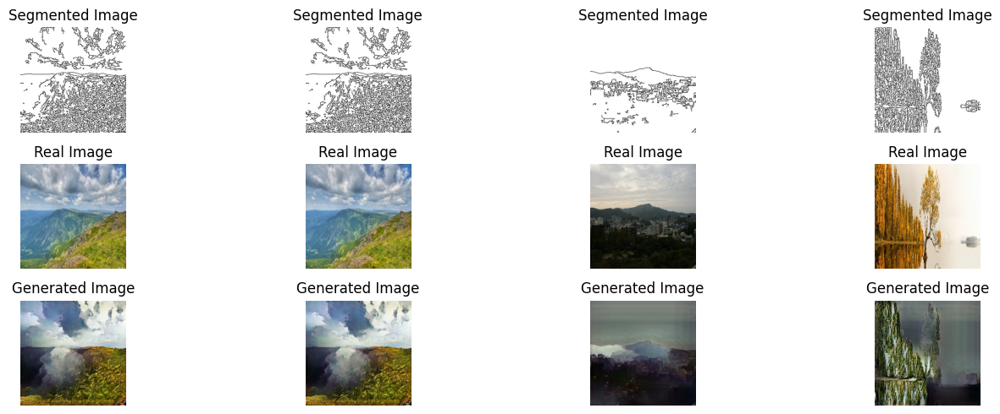

Epoch 96/200, Generator Loss: 2.181398868560791, Discriminator Loss: 1.000862717628479, Pixel Distance: 0.418063759803772
Epoch 97/200, Generator Loss: 1.9719760417938232, Discriminator Loss: 1.431877851486206, Pixel Distance: 0.44035840034484863
Epoch 98/200, Generator Loss: 1.693434238433838, Discriminator Loss: 1.1616299152374268, Pixel Distance: 0.5006138682365417
Epoch 99/200, Generator Loss: 4.16042423248291, Discriminator Loss: 1.0664710998535156, Pixel Distance: 0.4907383620738983
Epoch 100/200, Generator Loss: 7.695915699005127, Discriminator Loss: 0.5769597887992859, Pixel Distance: 0.5345329642295837


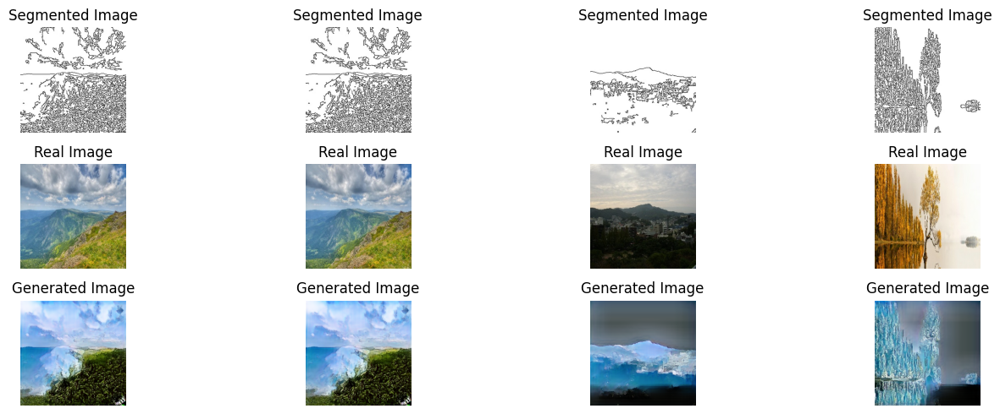

Epoch 101/200, Generator Loss: 2.206176996231079, Discriminator Loss: 0.8871772289276123, Pixel Distance: 0.43419957160949707
Epoch 102/200, Generator Loss: 14.619283676147461, Discriminator Loss: 1.3438047170639038, Pixel Distance: 0.48764172196388245
Epoch 103/200, Generator Loss: 11.250957489013672, Discriminator Loss: 0.18641230463981628, Pixel Distance: 0.6516502499580383
Epoch 104/200, Generator Loss: 5.176942825317383, Discriminator Loss: 2.0138278007507324, Pixel Distance: 0.46405234932899475
Epoch 105/200, Generator Loss: 14.540519714355469, Discriminator Loss: 0.6744458675384521, Pixel Distance: 0.4533446729183197


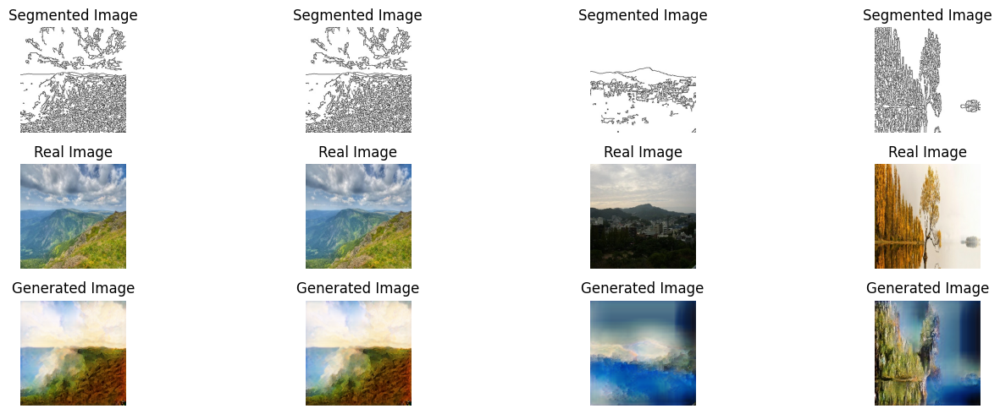

Epoch 106/200, Generator Loss: 4.574892997741699, Discriminator Loss: 0.8277666568756104, Pixel Distance: 0.45529064536094666
Epoch 107/200, Generator Loss: 2.722116708755493, Discriminator Loss: 1.1678223609924316, Pixel Distance: 0.49410608410835266
Epoch 108/200, Generator Loss: 2.6405107975006104, Discriminator Loss: 1.2910951375961304, Pixel Distance: 0.4528951942920685
Epoch 109/200, Generator Loss: 1.498755931854248, Discriminator Loss: 1.1257380247116089, Pixel Distance: 0.4296504557132721
Epoch 110/200, Generator Loss: 2.1226511001586914, Discriminator Loss: 1.1910083293914795, Pixel Distance: 0.4648869037628174


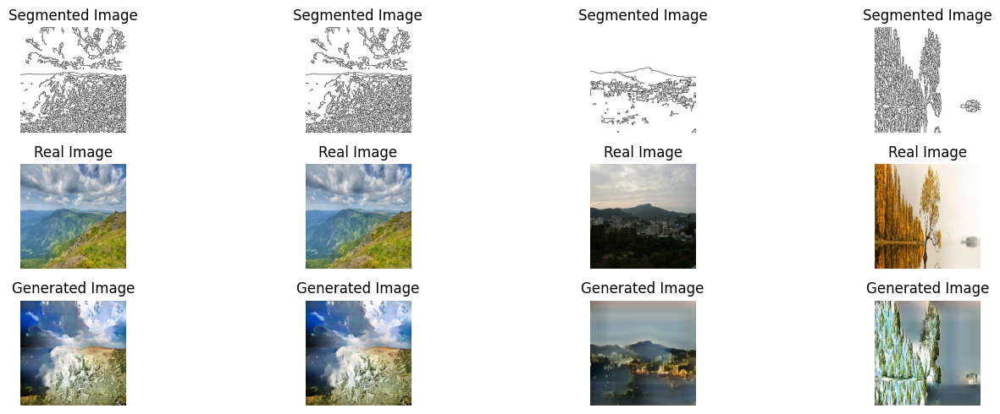

Epoch 111/200, Generator Loss: 1.7689287662506104, Discriminator Loss: 1.0614428520202637, Pixel Distance: 0.4455362856388092
Epoch 112/200, Generator Loss: 1.9693760871887207, Discriminator Loss: 1.2772839069366455, Pixel Distance: 0.41693511605262756
Epoch 113/200, Generator Loss: 2.344627857208252, Discriminator Loss: 0.7315950989723206, Pixel Distance: 0.43131017684936523
Epoch 114/200, Generator Loss: 4.706733226776123, Discriminator Loss: 0.8436554670333862, Pixel Distance: 0.49016842246055603
Epoch 115/200, Generator Loss: 1.601266860961914, Discriminator Loss: 1.1794648170471191, Pixel Distance: 0.4519917070865631


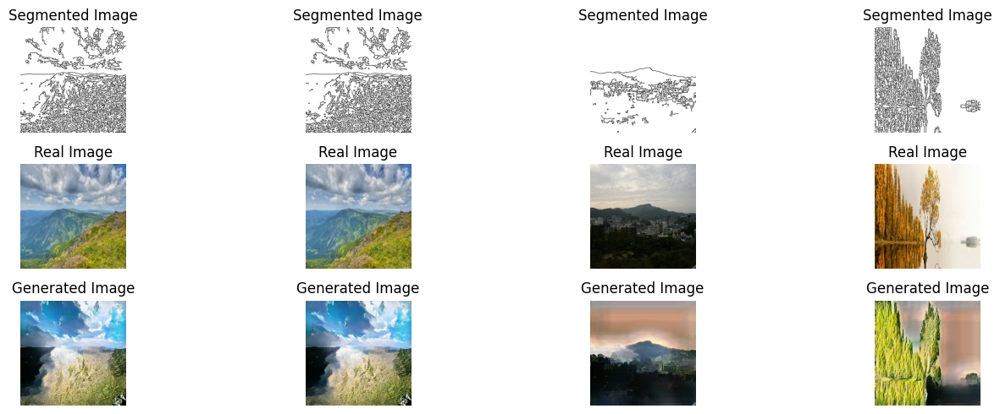

Epoch 116/200, Generator Loss: 1.8802934885025024, Discriminator Loss: 0.8161749839782715, Pixel Distance: 0.43959927558898926
Epoch 117/200, Generator Loss: 2.1799564361572266, Discriminator Loss: 1.5415762662887573, Pixel Distance: 0.4378826320171356
Epoch 118/200, Generator Loss: 2.570944309234619, Discriminator Loss: 0.8929093480110168, Pixel Distance: 0.44560861587524414
Epoch 119/200, Generator Loss: 2.1490283012390137, Discriminator Loss: 1.4440922737121582, Pixel Distance: 0.39588093757629395
Epoch 120/200, Generator Loss: 1.5119614601135254, Discriminator Loss: 1.3964416980743408, Pixel Distance: 0.42300543189048767


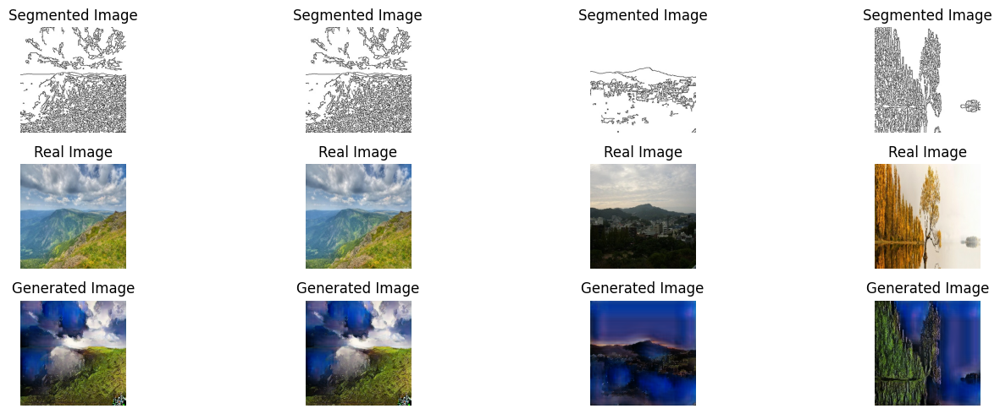

Epoch 121/200, Generator Loss: 2.7187647819519043, Discriminator Loss: 1.1881840229034424, Pixel Distance: 0.4390067160129547
Epoch 122/200, Generator Loss: 3.1894595623016357, Discriminator Loss: 1.0816195011138916, Pixel Distance: 0.42855334281921387
Epoch 123/200, Generator Loss: 3.526512861251831, Discriminator Loss: 1.348508358001709, Pixel Distance: 0.4759359359741211
Epoch 124/200, Generator Loss: 1.4081951379776, Discriminator Loss: 1.008885383605957, Pixel Distance: 0.4533524513244629
Epoch 125/200, Generator Loss: 2.531336784362793, Discriminator Loss: 1.4234801530838013, Pixel Distance: 0.4321978986263275


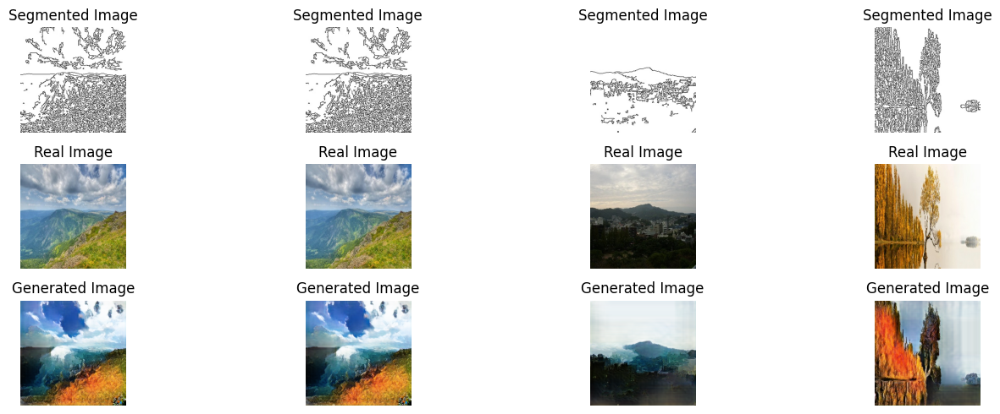

Epoch 126/200, Generator Loss: 2.17010235786438, Discriminator Loss: 0.9639196991920471, Pixel Distance: 0.42814669013023376
Epoch 127/200, Generator Loss: 2.8516674041748047, Discriminator Loss: 1.0774867534637451, Pixel Distance: 0.4528592526912689
Epoch 128/200, Generator Loss: 3.9726171493530273, Discriminator Loss: 1.0040241479873657, Pixel Distance: 0.4164755344390869
Epoch 129/200, Generator Loss: 3.2083029747009277, Discriminator Loss: 0.9433367252349854, Pixel Distance: 0.4696292579174042
Epoch 130/200, Generator Loss: 5.789831161499023, Discriminator Loss: 0.785813570022583, Pixel Distance: 0.3916037976741791


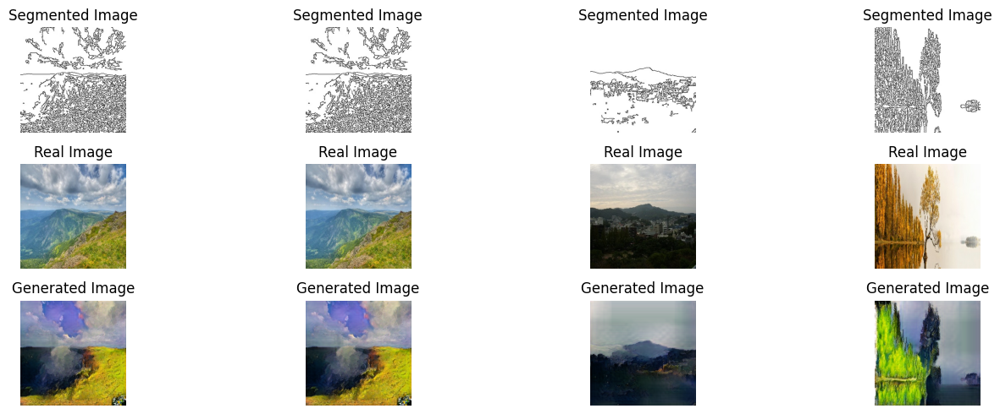

Epoch 131/200, Generator Loss: 2.722022771835327, Discriminator Loss: 0.8032305836677551, Pixel Distance: 0.47698792815208435
Epoch 132/200, Generator Loss: 2.2351572513580322, Discriminator Loss: 0.9724646806716919, Pixel Distance: 0.40218687057495117
Epoch 133/200, Generator Loss: 1.5376614332199097, Discriminator Loss: 1.5909113883972168, Pixel Distance: 0.428269624710083
Epoch 134/200, Generator Loss: 3.5823798179626465, Discriminator Loss: 1.015795350074768, Pixel Distance: 0.44364842772483826
Epoch 135/200, Generator Loss: 2.48281192779541, Discriminator Loss: 1.4550554752349854, Pixel Distance: 0.42031005024909973


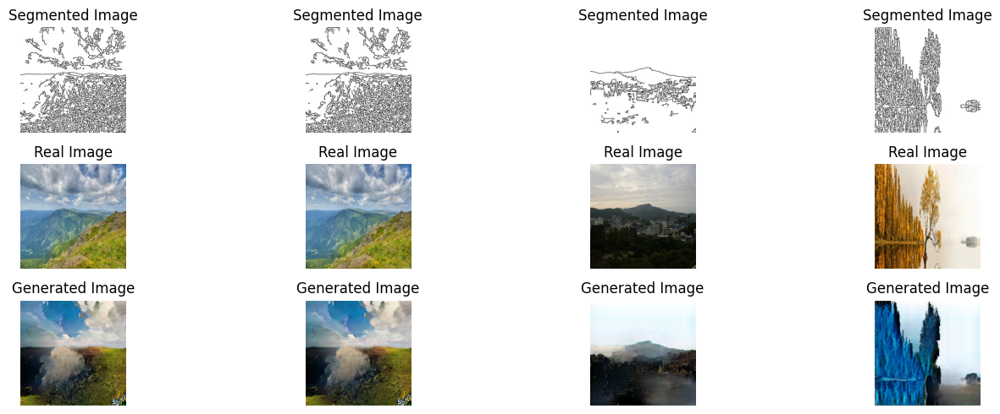

Epoch 136/200, Generator Loss: 3.918328285217285, Discriminator Loss: 1.1460633277893066, Pixel Distance: 0.4254746735095978
Epoch 137/200, Generator Loss: 3.6914589405059814, Discriminator Loss: 1.785321593284607, Pixel Distance: 0.4163970947265625
Epoch 138/200, Generator Loss: 4.20646333694458, Discriminator Loss: 1.4361258745193481, Pixel Distance: 0.44236060976982117
Epoch 139/200, Generator Loss: 4.416703224182129, Discriminator Loss: 0.5201181769371033, Pixel Distance: 0.4792753756046295
Epoch 140/200, Generator Loss: 4.186279296875, Discriminator Loss: 1.99928617477417, Pixel Distance: 0.4496331214904785


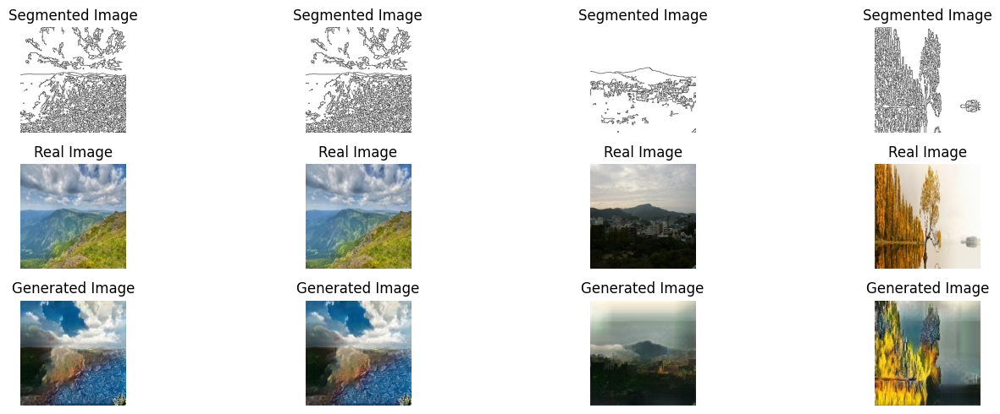

Epoch 141/200, Generator Loss: 2.6950905323028564, Discriminator Loss: 1.2084732055664062, Pixel Distance: 0.43455958366394043
Epoch 142/200, Generator Loss: 4.494159698486328, Discriminator Loss: 0.7641502618789673, Pixel Distance: 0.3977418839931488
Epoch 143/200, Generator Loss: 3.4531993865966797, Discriminator Loss: 1.0324575901031494, Pixel Distance: 0.48467913269996643
Epoch 144/200, Generator Loss: 2.4669137001037598, Discriminator Loss: 1.3242383003234863, Pixel Distance: 0.43327704071998596
Epoch 145/200, Generator Loss: 3.6036176681518555, Discriminator Loss: 1.0536861419677734, Pixel Distance: 0.42150187492370605


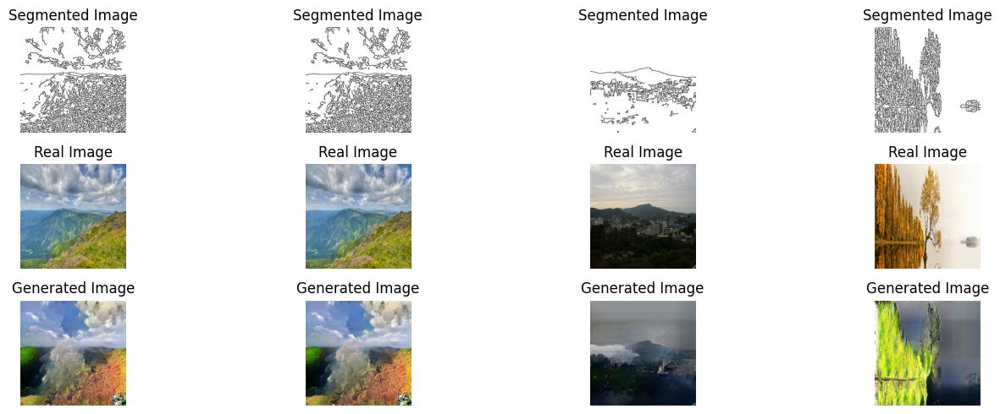

Epoch 146/200, Generator Loss: 1.5689903497695923, Discriminator Loss: 1.448934555053711, Pixel Distance: 0.4618046283721924
Epoch 147/200, Generator Loss: 2.342062473297119, Discriminator Loss: 1.3713693618774414, Pixel Distance: 0.4598136246204376
Epoch 148/200, Generator Loss: 2.4830946922302246, Discriminator Loss: 1.0179009437561035, Pixel Distance: 0.42126402258872986
Epoch 149/200, Generator Loss: 14.867981910705566, Discriminator Loss: 0.8154882192611694, Pixel Distance: 0.4145810902118683
Epoch 150/200, Generator Loss: 4.88835334777832, Discriminator Loss: 0.3509201407432556, Pixel Distance: 0.4713343679904938


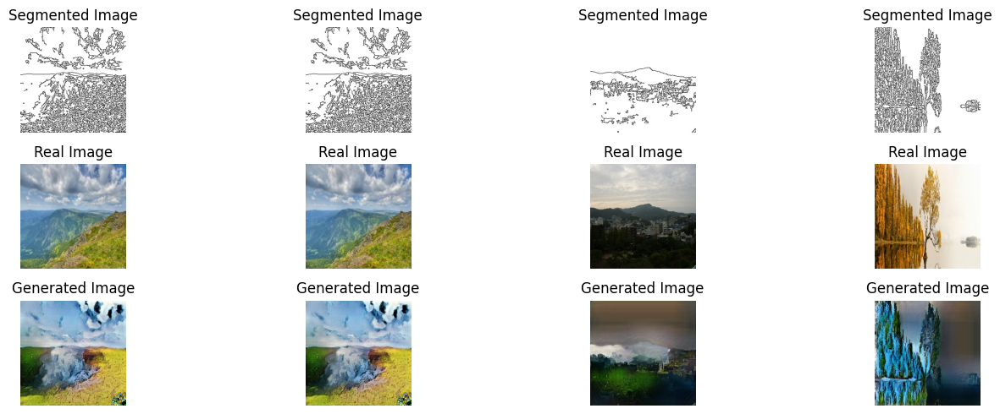

Epoch 151/200, Generator Loss: 3.164233446121216, Discriminator Loss: 1.4894824028015137, Pixel Distance: 0.42300328612327576
Epoch 152/200, Generator Loss: 2.143015146255493, Discriminator Loss: 1.1042879819869995, Pixel Distance: 0.4445019066333771
Epoch 153/200, Generator Loss: 2.299586534500122, Discriminator Loss: 1.7297431230545044, Pixel Distance: 0.39679381251335144
Epoch 154/200, Generator Loss: 3.889831066131592, Discriminator Loss: 0.6529970169067383, Pixel Distance: 0.4553968906402588
Epoch 155/200, Generator Loss: 2.779049873352051, Discriminator Loss: 1.1108322143554688, Pixel Distance: 0.4383382499217987


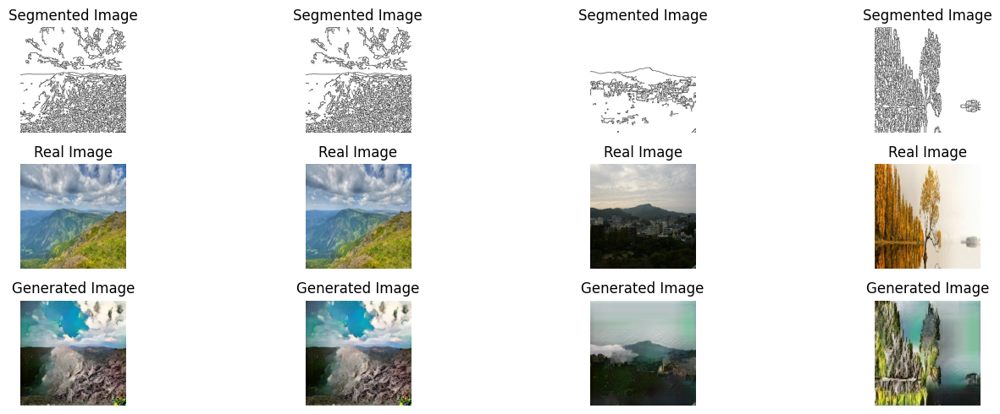

Epoch 156/200, Generator Loss: 1.6092631816864014, Discriminator Loss: 1.223122477531433, Pixel Distance: 0.4023420810699463
Epoch 157/200, Generator Loss: 2.0799641609191895, Discriminator Loss: 1.5244337320327759, Pixel Distance: 0.4271012842655182
Epoch 158/200, Generator Loss: 1.8943541049957275, Discriminator Loss: 1.1102702617645264, Pixel Distance: 0.46677184104919434
Epoch 159/200, Generator Loss: 2.7751410007476807, Discriminator Loss: 0.8888075947761536, Pixel Distance: 0.40347710251808167
Epoch 160/200, Generator Loss: 2.744345188140869, Discriminator Loss: 0.8349847197532654, Pixel Distance: 0.42794761061668396


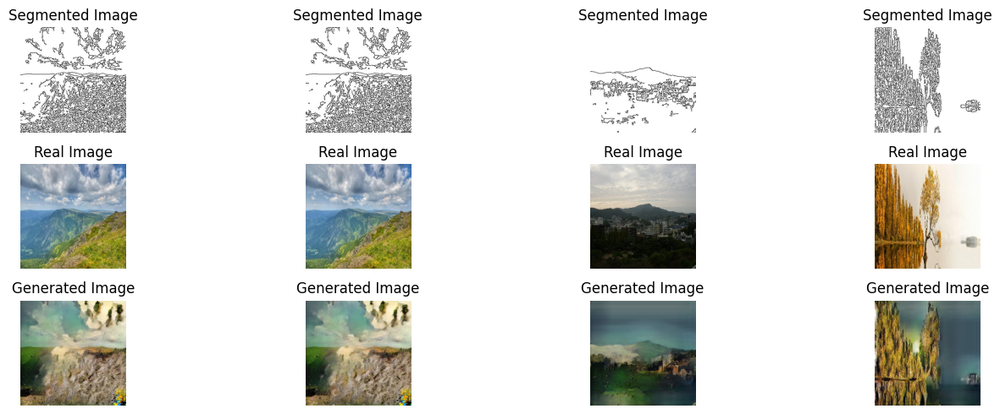

In [ ]:
epochs = 200
batch_size = 12
train_dataset = create_dataset(paired_paths)
# Train the pix2pix model
train_pix2pix(generator, discriminator, epochs, train_dataset, generator_optimizer, discriminator_optimizer, generator_loss, discriminator_loss)